In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os

# Paths to data files
train_csv = os.path.expanduser("/Users/wooyongjung/WJ_Projects/HomelessStudy_SanFrancisco_2025_rev/data/df_cleaned_20250617.csv")
test_csv  = "data/stvgp_pois_constmean_t400r300_withamenities_parquet.csv"

# Load and preprocess training data
df_train = pd.read_csv(train_csv, parse_dates=['timestamp'])
df_train = df_train.dropna(subset=['ground_truth'])  # only actual observations

# Load prediction results
df_test = pd.read_csv(test_csv, parse_dates=['timestamp'])

/var/folders/y6/z9h695vx2w3gbjh7z32h4j9m0000gn/T/ipykernel_42891/3032142480.py:15: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_test = pd.read_csv(test_csv, parse_dates=['timestamp'])


In [3]:
test_csv_noclamp  = "data/stvgp_pois_constmean_t400r300_withamenities_parquet_noclamp.csv"
df_test_noclamp = pd.read_csv(test_csv, parse_dates=['timestamp'])

/var/folders/y6/z9h695vx2w3gbjh7z32h4j9m0000gn/T/ipykernel_42891/2810042736.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_test_noclamp = pd.read_csv(test_csv, parse_dates=['timestamp'])


In [4]:
# Convert the seconds‐since‐epoch column to datetime
df_test['timestamp'] = pd.to_datetime(df_test['timestamp'], unit='s').dt.date

# Make sure both dataframes have the same date format
df_train['timestamp'] = pd.to_datetime(df_train['timestamp']).dt.date

# Rename columns for consistency
df_train.rename(columns={'ground_truth': 'count'}, inplace=True)
df_test.rename(columns={'pred_mean_Y': 'count','pred_var_Y':'var','rate_median':'median','rate_lower95':'lower95','rate_upper95':'upper95','rate_lower90':'lower90','rate_upper90':'upper90'}, inplace=True)

# Add a 'category' column to distinguish between training and prediction data
df_train['category'] = 'train'
df_test['category'] = 'prediction'

# Create a empty columns to combine two dataframes
df_train['median'] = np.nan
df_train['var'] = np.nan
df_train['lower95'] = np.nan
df_train['upper95'] = np.nan
df_train['lower90'] = np.nan
df_train['upper90'] = np.nan

# Combine the two dataframes
df_combined = pd.concat([df_train, df_test], ignore_index=True)

/var/folders/y6/z9h695vx2w3gbjh7z32h4j9m0000gn/T/ipykernel_42891/2344571355.py:2: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df_test['timestamp'] = pd.to_datetime(df_test['timestamp'], unit='s').dt.date


In [5]:
# Convert the seconds‐since‐epoch column to datetime
df_test_noclamp['timestamp'] = pd.to_datetime(df_test_noclamp['timestamp'], unit='s').dt.date

# Rename columns for consistency
df_test_noclamp.rename(columns={'pred_mean_Y': 'count','pred_var_Y':'var','rate_median':'median','rate_lower95':'lower95','rate_upper95':'upper95','rate_lower90':'lower90','rate_upper90':'upper90'}, inplace=True)

# Add a 'category' column to distinguish between training and prediction data
df_test_noclamp['category'] = 'prediction'

# Combine the two dataframes
df_combined_noclamp = pd.concat([df_train, df_test_noclamp], ignore_index=True)

/var/folders/y6/z9h695vx2w3gbjh7z32h4j9m0000gn/T/ipykernel_42891/1145706525.py:2: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df_test_noclamp['timestamp'] = pd.to_datetime(df_test_noclamp['timestamp'], unit='s').dt.date


In [ ]:
# # Needed columns
# needed_columns = ['timestamp', 'bboxid','GEOID', 'count', 'median', 'var', 'lower95', 'upper95', 'lower90', 'upper90', 'category']
# df_combined = df_combined[needed_columns]

# # # Fill Nan values with count values of each row
# df_combined['median'].fillna(df_combined['count'], inplace=True)
# df_combined['var'].fillna(0, inplace=True)
# df_combined['lower95'].fillna(df_combined['count'], inplace=True)
# df_combined['upper95'].fillna(df_combined['count'], inplace=True)
# df_combined['lower90'].fillna(df_combined['count'], inplace=True)
# df_combined['upper90'].fillna(df_combined['count'], inplace=True)

/var/folders/y6/z9h695vx2w3gbjh7z32h4j9m0000gn/T/ipykernel_1994/1460359239.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_combined['median'].fillna(df_combined['count'], inplace=True)
/var/folders/y6/z9h695vx2w3gbjh7z32h4j9m0000gn/T/ipykernel_1994/1460359239.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setti

In [6]:
# Needed columns
needed_columns = ['timestamp', 'bboxid','GEOID', 'count', 'median', 'var', 'lower95', 'upper95', 'lower90', 'upper90', 'category']
df_combined_noclamp = df_combined_noclamp[needed_columns]

# # Fill Nan values with count values of each row
df_combined_noclamp['median'].fillna(df_combined_noclamp['count'], inplace=True)
df_combined_noclamp['var'].fillna(0, inplace=True)
df_combined_noclamp['lower95'].fillna(df_combined_noclamp['count'], inplace=True)
df_combined_noclamp['upper95'].fillna(df_combined_noclamp['count'], inplace=True)
df_combined_noclamp['lower90'].fillna(df_combined_noclamp['count'], inplace=True)
df_combined_noclamp['upper90'].fillna(df_combined_noclamp['count'], inplace=True)

/var/folders/y6/z9h695vx2w3gbjh7z32h4j9m0000gn/T/ipykernel_42891/1175435893.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_combined_noclamp['median'].fillna(df_combined_noclamp['count'], inplace=True)
/var/folders/y6/z9h695vx2w3gbjh7z32h4j9m0000gn/T/ipykernel_42891/1175435893.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on 

In [7]:
df_combined.shape

(13461046, 57)

In [8]:
df_combined_noclamp.shape

(13461046, 11)

In [9]:
# Load ground-truth sf data
df_sf = pd.read_csv('/Users/wooyongjung/WJ_Projects/HomelessStudy_SanFrancisco_2025_rev/data/sf_tent.csv')

# Drop rows with NaN in 'date' column
df_sf = df_sf.dropna(subset=['date'], axis=0)

# Create timestamp column in df_sf using year, month, and day
df_sf.rename(columns={'date': 'day'}, inplace=True)
df_sf['timestamp'] = pd.to_datetime(df_sf[['year', 'month', 'day']])

df_sf

,year,month,day,tents,structure,sites,tent_struc,timestamp
3,2019,4,23.0,207.0,173.0,442.0,380,2019-04-23
4,2019,4,24.0,207.0,173.0,442.0,380,2019-04-24
5,2019,7,23.0,264.0,187.0,437.0,451,2019-07-23
6,2019,7,24.0,264.0,187.0,437.0,451,2019-07-24
7,2019,10,23.0,272.0,175.0,501.0,447,2019-10-23
8,2020,1,22.0,459.0,190.0,601.0,649,2020-01-22
9,2020,4,20.0,897.0,211.0,427.0,1108,2020-04-20
10,2020,4,21.0,897.0,211.0,427.0,1108,2020-04-21
11,2020,4,22.0,897.0,211.0,427.0,1108,2020-04-22
12,2020,7,29.0,790.0,213.0,426.0,1003,2020-07-29


## Monte Carlo Aggregation

### Aggregation with df_combined_noclamp

In [79]:
df_combined_noclamp.head()

,timestamp,bboxid,GEOID,count,median,var,lower95,upper95,lower90,upper90,category
0,2016-11-09,bbox_10_14,60750604002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,train
1,2016-11-10,bbox_10_14,60750604002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,train
2,2016-11-10,bbox_10_15,60750332043,0.0,0.0,0.0,0.0,0.0,0.0,0.0,train
3,2016-11-09,bbox_10_16,60750332043,0.0,0.0,0.0,0.0,0.0,0.0,0.0,train
4,2016-11-10,bbox_10_16,60750332043,0.0,0.0,0.0,0.0,0.0,0.0,0.0,train


In [20]:
# Monte Carlo aggregation to city‐daily totals with P(Y>0) thresholding
S          = 500
p_thresh   = 0.69   # drop any box whose P(Y>0) < 0.69
daily_out  = []
n_days     = df_combined_noclamp['timestamp'].nunique()

# z‐score for 95% CI
z95 = 1.96
z90 = 1.645

from tqdm import tqdm

# additions inside your loop (store city-level lambda draws for NLPD
lambda_draws_by_day = {}  # timestamp -> np.array of Λ_s

for day, grp in tqdm(df_combined_noclamp.groupby('timestamp'),
                     total=n_days,
                     desc="Aggregating city totals"):
    
    # pull out your per-box summaries
    med   = grp['median'].values    # median λ_i
    l95   = grp['lower95'].values
    # compute P(Y_i > 0) ≈ 1 - exp(-med)
    p_any = 1 - np.exp(-med)
    
    # keep only boxes likely to have tents
    keep_mask = p_any >= p_thresh
    if not keep_mask.any():
        # no boxes pass the threshold → zero tents
        daily_out.append({
            'timestamp':  day,
            'mean_total': 0.0,
            'median_total': 0.0,
            'lower95': 0.0,
            'upper95': 0.0,
            'lower90': 0.0,
            'upper90': 0.0,
        })
        continue
    
    med_filt = med[keep_mask]
    l95_filt = l95[keep_mask]
    nbox     = med_filt.size
    
    # reconstruct log-normal latent params
    mu_f    = np.log(med_filt)
    sigma_f = (np.log(med_filt) - np.log(l95_filt)) / z95
    
    # Monte Carlo draws
    f_samps = np.random.normal(
        loc=mu_f[None, :],
        scale=sigma_f[None, :],
        size=(S, nbox)
    )
    lam_samps = np.exp(f_samps)
    # optional hard cap
    lam_samps = np.minimum(lam_samps, 1e3)

    # draw Poisson counts and sum
    y_samps     = np.random.poisson(lam_samps)
    city_samps  = y_samps.sum(axis=1)

    # Store city-level lambda draws (Λ_s = sum_i λ_{i,s}) for NLPD
    lambda_draws_by_day[day] = lam_samps.sum(axis=1)

    # store summary
    daily_out.append({
        'timestamp':    day,
        'mean_total':   city_samps.mean(),
        'median_total': np.median(city_samps),
        'lower95':      np.percentile(city_samps, 2.5),
        'upper95':      np.percentile(city_samps, 97.5),
        'lower90':      np.percentile(city_samps, 5.0),
        'upper90':      np.percentile(city_samps, 95.0),
    })

# assemble final daily DataFrame
df_daily_69_noclamp = (
    pd.DataFrame(daily_out)
      .sort_values('timestamp')
      .reset_index(drop=True)
)
print(df_daily_69_noclamp.head())

# Make sure the timestamp is in datetime format
df_daily_69_noclamp['timestamp'] = pd.to_datetime(df_daily_69_noclamp['timestamp'])
df_sf['timestamp'] = pd.to_datetime(df_sf['timestamp'])

# Align by timestamp (use the ground-truth date restriction you intended)
df_eval = (
    df_sf[df_sf['timestamp'] < '2024-06-01'][['timestamp','tents']]
    .merge(df_daily_69_noclamp[['timestamp','mean_total']], on='timestamp', how='inner')
    .rename(columns={'tents':'y','mean_total':'yhat'})
    .sort_values('timestamp')
    .reset_index(drop=True)
)

y    = df_eval['y'].to_numpy(dtype=float)
yhat = df_eval['yhat'].to_numpy(dtype=float)

# Metrics
EPS = 1e-12

# RMSE
rmse = np.sqrt(np.mean((yhat - y)**2))

# 1) MAPE (you said no zeros in y)
mape = np.mean(np.abs(yhat - y) / (y + EPS)) * 100.0

# 2) Mean Poisson Deviance (count-likelihood grounded)
#    D = (2/n) * sum( y*log(y/mu) - (y - mu) )
def mean_poisson_deviance(y, mu, eps=EPS):
    y  = np.asarray(y, dtype=float)
    mu = np.asarray(mu, dtype=float)
    return 2.0 * np.mean(y * (np.log((y + eps) / (mu + eps))) - (y - mu))

mpd = mean_poisson_deviance(y, yhat)

# 3) NLPD using a mixture-of-Poissons predictive:
#    For each day t, p(y_t) = (1/S) * sum_s PoissonPMF(y_t | Λ_{t,s})
from scipy.special import gammaln

def log_pois_pmf(k, lam, eps=EPS):
    # vectorized: k is scalar, lam is array
    # log p(k|lam) = k*log(lam) - lam - log(k!)
    return k*np.log(lam + eps) - lam - gammaln(k + 1.0)

def day_log_predictive(k, lambda_draws):
    # log mean of exponentiated log pmfs = log( mean_s exp(log p_s) )
    # use log-sum-exp for stability
    lp = log_pois_pmf(k, lambda_draws)
    m  = np.max(lp)
    return m + np.log(np.mean(np.exp(lp - m) + 0.0))

# Build per-day NLPD by pulling the correct Λ_draws for each timestamp
logps = []
for ts, k in zip(df_eval['timestamp'].tolist(), y.astype(int)):
    lam_draws = lambda_draws_by_day.get(ts, None)
    if lam_draws is None or len(lam_draws) == 0:
        # Fallback: use single Poisson with mean yhat when draws are missing
        lam_draws = np.array([df_eval.loc[df_eval['timestamp']==ts, 'yhat'].item()], dtype=float)
    logps.append(day_log_predictive(k, lam_draws))

nlpd = -np.mean(logps)

print(f"Lambda threshold: {p_thresh}")
print(f"RMSE: {rmse:.3f}")
print(f"MAPE (%): {mape:.2f}")
print(f"Mean Poisson Deviance: {mpd:.4f}")
print(f"NLPD: {nlpd:.4f}")


Aggregating city totals: 100%|██████████| 3074/3074 [01:11<00:00, 43.14it/s] 


    timestamp  mean_total  median_total  lower95  upper95  lower90  upper90
0  2016-01-01     164.700         164.0  140.475  193.000   144.95    188.0
1  2016-01-02     193.914         194.0  168.475  220.525   172.00    216.0
2  2016-01-03     222.442         222.0  193.000  251.000   197.00    247.0
3  2016-01-04     228.514         229.0  200.000  256.000   205.00    252.0
4  2016-01-05     194.942         195.0  168.000  222.000   172.00    219.0
Lambda threshold: 0.69
RMSE: 251.651
MAPE (%): 58.49
Mean Poisson Deviance: 115.4865
NLPD: 61.5947


In [81]:
# Monte Carlo aggregation to city‐daily totals with P(Y>0) thresholding
S          = 500
p_thresh   = 0.70   # drop any box whose P(Y>0) < 0.70
daily_out  = []
n_days     = df_combined_noclamp['timestamp'].nunique()

# z‐score for 95% CI
z95 = 1.96
z90 = 1.645

from tqdm import tqdm
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from scipy.stats import poisson

# additions inside your loop (store city-level lambda draws for NLPD
lambda_draws_by_day = {}  # timestamp -> np.array of Λ_s

for day, grp in tqdm(df_combined_noclamp.groupby('timestamp'),
                     total=n_days,
                     desc="Aggregating city totals"):
    
    # pull out your per-box summaries
    med   = grp['median'].values    # median λ_i
    l95   = grp['lower95'].values
    # compute P(Y_i > 0) ≈ 1 - exp(-med)
    p_any = 1 - np.exp(-med)
    
    # keep only boxes likely to have tents
    keep_mask = p_any >= p_thresh
    if not keep_mask.any():
        # no boxes pass the threshold → zero tents
        daily_out.append({
            'timestamp':  day,
            'mean_total': 0.0,
            'median_total': 0.0,
            'lower95': 0.0,
            'upper95': 0.0,
            'lower90': 0.0,
            'upper90': 0.0,
        })
        continue
    
    med_filt = med[keep_mask]
    l95_filt = l95[keep_mask]
    nbox     = med_filt.size
    
    # reconstruct log-normal latent params
    mu_f    = np.log(med_filt)
    sigma_f = (np.log(med_filt) - np.log(l95_filt)) / z95
    
    # Monte Carlo draws
    f_samps = np.random.normal(
        loc=mu_f[None, :],
        scale=sigma_f[None, :],
        size=(S, nbox)
    )
    lam_samps = np.exp(f_samps)
    # optional hard cap
    lam_samps = np.minimum(lam_samps, 1e3)

    # draw Poisson counts and sum
    y_samps     = np.random.poisson(lam_samps)
    city_samps  = y_samps.sum(axis=1)

    # Store city-level lambda draws (Λ_s = sum_i λ_{i,s}) for NLPD
    lambda_draws_by_day[day] = lam_samps.sum(axis=1)

    # store summary
    daily_out.append({
        'timestamp':    day,
        'mean_total':   city_samps.mean(),
        'median_total': np.median(city_samps),
        'lower95':      np.percentile(city_samps, 2.5),
        'upper95':      np.percentile(city_samps, 97.5),
        'lower90':      np.percentile(city_samps, 5.0),
        'upper90':      np.percentile(city_samps, 95.0),
    })

# assemble final daily DataFrame
df_daily_70_noclamp = (
    pd.DataFrame(daily_out)
      .sort_values('timestamp')
      .reset_index(drop=True)
)
print(df_daily_70_noclamp.head())

# Make sure the timestamp is in datetime format
df_daily_70_noclamp['timestamp'] = pd.to_datetime(df_daily_70_noclamp['timestamp'])
df_sf['timestamp'] = pd.to_datetime(df_sf['timestamp'])

# Align by timestamp (use the ground-truth date restriction you intended)
df_eval = (
    df_sf[df_sf['timestamp'] < '2024-06-01'][['timestamp','tents']]
    .merge(df_daily_70_noclamp[['timestamp','mean_total']], on='timestamp', how='inner')
    .rename(columns={'tents':'y','mean_total':'yhat'})
    .sort_values('timestamp')
    .reset_index(drop=True)
)

y    = df_eval['y'].to_numpy(dtype=float)
yhat = df_eval['yhat'].to_numpy(dtype=float)

# Metrics
EPS = 1e-12


# RMSE
rmse = np.sqrt(mean_squared_error(y, yhat))

# 1) MAPE (you said no zeros in y)
mape = mean_absolute_percentage_error(y, yhat) * 100.0
#mape = np.mean(np.abs(yhat - y) / (y + EPS)) * 100.0

# 2) Mean Poisson Deviance (count-likelihood grounded)
#    D = (2/n) * sum( y*log(y/mu) - (y - mu) )
def mean_poisson_deviance(y, mu, eps=EPS):
    y  = np.asarray(y, dtype=float)
    mu = np.asarray(mu, dtype=float)
    return 2.0 * np.mean(y * (np.log((y + eps) / (mu + eps))) - (y - mu))

mpd = mean_poisson_deviance(y, yhat)

# 3) NLPD using a mixture-of-Poissons predictive:
# #    For each day t, p(y_t) = (1/S) * sum_s PoissonPMF(y_t | Λ_{t,s})
# from scipy.special import gammaln

# def log_pois_pmf(k, lam, eps=EPS):
#     # vectorized: k is scalar, lam is array
#     # log p(k|lam) = k*log(lam) - lam - log(k!)
#     return k*np.log(lam + eps) - lam - gammaln(k + 1.0)

# def day_log_predictive(k, lambda_draws):
#     # log mean of exponentiated log pmfs = log( mean_s exp(log p_s) )
#     # use log-sum-exp for stability
#     lp = log_pois_pmf(k, lambda_draws)
#     m  = np.max(lp)
#     return m + np.log(np.mean(np.exp(lp - m) + 0.0))

# # Build per-day NLPD by pulling the correct Λ_draws for each timestamp
# logps = []
# for ts, k in zip(df_eval['timestamp'].tolist(), y.astype(int)):
#     lam_draws = lambda_draws_by_day.get(ts, None)
#     if lam_draws is None or len(lam_draws) == 0:
#         # Fallback: use single Poisson with mean yhat when draws are missing
#         lam_draws = np.array([df_eval.loc[df_eval['timestamp']==ts, 'yhat'].item()], dtype=float)
#     logps.append(day_log_predictive(k, lam_draws))

# nlpd = -np.mean(logps)
nlpd = -poisson.logpmf(y, yhat).mean()

print(f"Lambda threshold: {p_thresh}")
print(f"RMSE: {rmse:.3f}")
print(f"MAPE (%): {mape:.2f}")
print(f"Mean Poisson Deviance: {mpd:.4f}")
print(f"NLPD: {nlpd:.4f}")


Aggregating city totals: 100%|██████████| 3074/3074 [00:51<00:00, 59.88it/s] 

    timestamp  mean_total  median_total  lower95  upper95  lower90  upper90
0  2016-01-01     137.016         136.0    115.0  158.525    118.0   156.00
1  2016-01-02     159.978         160.0    137.0  184.525    139.0   181.00
2  2016-01-03     176.884         177.0    151.0  202.000    155.0   198.05
3  2016-01-04     190.686         191.0    164.0  218.525    168.0   213.00
4  2016-01-05     155.942         156.0    131.0  185.050    134.0   177.00
Lambda threshold: 0.7
RMSE: 203.620
MAPE (%): 41.59
Mean Poisson Deviance: 92.6340
NLPD: 50.1684


In [21]:
# Monte Carlo aggregation to city‐daily totals with P(Y>0) thresholding
S          = 500
p_thresh   = 0.71   # drop any box whose P(Y>0) < 0.71
daily_out  = []
n_days     = df_combined_noclamp['timestamp'].nunique()

# z‐score for 95% CI
z95 = 1.96
z90 = 1.645

from tqdm import tqdm

# additions inside your loop (store city-level lambda draws for NLPD
lambda_draws_by_day = {}  # timestamp -> np.array of Λ_s

for day, grp in tqdm(df_combined_noclamp.groupby('timestamp'),
                     total=n_days,
                     desc="Aggregating city totals"):
    
    # pull out your per-box summaries
    med   = grp['median'].values    # median λ_i
    l95   = grp['lower95'].values
    # compute P(Y_i > 0) ≈ 1 - exp(-med)
    p_any = 1 - np.exp(-med)
    
    # keep only boxes likely to have tents
    keep_mask = p_any >= p_thresh
    if not keep_mask.any():
        # no boxes pass the threshold → zero tents
        daily_out.append({
            'timestamp':  day,
            'mean_total': 0.0,
            'median_total': 0.0,
            'lower95': 0.0,
            'upper95': 0.0,
            'lower90': 0.0,
            'upper90': 0.0,
        })
        continue
    
    med_filt = med[keep_mask]
    l95_filt = l95[keep_mask]
    nbox     = med_filt.size
    
    # reconstruct log-normal latent params
    mu_f    = np.log(med_filt)
    sigma_f = (np.log(med_filt) - np.log(l95_filt)) / z95
    
    # Monte Carlo draws
    f_samps = np.random.normal(
        loc=mu_f[None, :],
        scale=sigma_f[None, :],
        size=(S, nbox)
    )
    lam_samps = np.exp(f_samps)
    # optional hard cap
    lam_samps = np.minimum(lam_samps, 1e3)

    # draw Poisson counts and sum
    y_samps     = np.random.poisson(lam_samps)
    city_samps  = y_samps.sum(axis=1)

    # Store city-level lambda draws (Λ_s = sum_i λ_{i,s}) for NLPD
    lambda_draws_by_day[day] = lam_samps.sum(axis=1)

    # store summary
    daily_out.append({
        'timestamp':    day,
        'mean_total':   city_samps.mean(),
        'median_total': np.median(city_samps),
        'lower95':      np.percentile(city_samps, 2.5),
        'upper95':      np.percentile(city_samps, 97.5),
        'lower90':      np.percentile(city_samps, 5.0),
        'upper90':      np.percentile(city_samps, 95.0),
    })

# assemble final daily DataFrame
df_daily_71_noclamp = (
    pd.DataFrame(daily_out)
      .sort_values('timestamp')
      .reset_index(drop=True)
)
print(df_daily_71_noclamp.head())

# Make sure the timestamp is in datetime format
df_daily_71_noclamp['timestamp'] = pd.to_datetime(df_daily_71_noclamp['timestamp'])
df_sf['timestamp'] = pd.to_datetime(df_sf['timestamp'])

# Align by timestamp (use the ground-truth date restriction you intended)
df_eval = (
    df_sf[df_sf['timestamp'] < '2024-06-01'][['timestamp','tents']]
    .merge(df_daily_71_noclamp[['timestamp','mean_total']], on='timestamp', how='inner')
    .rename(columns={'tents':'y','mean_total':'yhat'})
    .sort_values('timestamp')
    .reset_index(drop=True)
)

y    = df_eval['y'].to_numpy(dtype=float)
yhat = df_eval['yhat'].to_numpy(dtype=float)

# Metrics
EPS = 1e-12

# RMSE
rmse = np.sqrt(np.mean((yhat - y)**2))

# 1) MAPE (you said no zeros in y)
mape = np.mean(np.abs(yhat - y) / (y + EPS)) * 100.0

# 2) Mean Poisson Deviance (count-likelihood grounded)
#    D = (2/n) * sum( y*log(y/mu) - (y - mu) )
def mean_poisson_deviance(y, mu, eps=EPS):
    y  = np.asarray(y, dtype=float)
    mu = np.asarray(mu, dtype=float)
    return 2.0 * np.mean(y * (np.log((y + eps) / (mu + eps))) - (y - mu))

mpd = mean_poisson_deviance(y, yhat)

# 3) NLPD using a mixture-of-Poissons predictive:
#    For each day t, p(y_t) = (1/S) * sum_s PoissonPMF(y_t | Λ_{t,s})
from scipy.special import gammaln

def log_pois_pmf(k, lam, eps=EPS):
    # vectorized: k is scalar, lam is array
    # log p(k|lam) = k*log(lam) - lam - log(k!)
    return k*np.log(lam + eps) - lam - gammaln(k + 1.0)

def day_log_predictive(k, lambda_draws):
    # log mean of exponentiated log pmfs = log( mean_s exp(log p_s) )
    # use log-sum-exp for stability
    lp = log_pois_pmf(k, lambda_draws)
    m  = np.max(lp)
    return m + np.log(np.mean(np.exp(lp - m) + 0.0))

# Build per-day NLPD by pulling the correct Λ_draws for each timestamp
logps = []
for ts, k in zip(df_eval['timestamp'].tolist(), y.astype(int)):
    lam_draws = lambda_draws_by_day.get(ts, None)
    if lam_draws is None or len(lam_draws) == 0:
        # Fallback: use single Poisson with mean yhat when draws are missing
        lam_draws = np.array([df_eval.loc[df_eval['timestamp']==ts, 'yhat'].item()], dtype=float)
    logps.append(day_log_predictive(k, lam_draws))

nlpd = -np.mean(logps)

print(f"Lambda threshold: {p_thresh}")
print(f"RMSE: {rmse:.3f}")
print(f"MAPE (%): {mape:.2f}")
print(f"Mean Poisson Deviance: {mpd:.4f}")
print(f"NLPD: {nlpd:.4f}")


Aggregating city totals: 100%|██████████| 3074/3074 [00:58<00:00, 52.86it/s] 


    timestamp  mean_total  median_total  lower95  upper95  lower90  upper90
0  2016-01-01     114.738         115.0   93.475    137.0    96.95    134.0
1  2016-01-02     143.308         142.0  121.000    171.0   125.00    165.0
2  2016-01-03     155.312         155.0  133.000    180.0   135.00    177.0
3  2016-01-04     157.352         157.0  133.000    183.0   137.00    178.0
4  2016-01-05     142.374         142.0  121.000    168.0   125.00    162.0
Lambda threshold: 0.71
RMSE: 205.452
MAPE (%): 41.93
Mean Poisson Deviance: 116.6749
NLPD: 62.1889


### Visualization

In [22]:
# Merge df_daily_70_noclamp and df_sf on 'timestamp'
df_merge_70_noclamp = df_daily_70_noclamp.merge(df_sf[df_sf['timestamp'] < '2025-01-01'][['timestamp', 'tents', 'tent_struc']], on='timestamp', how='left')

# Merge df_daily_69_noclamp and df_sf on 'timestamp'
df_merge_69_noclamp = df_daily_69_noclamp.merge(df_sf[df_sf['timestamp'] < '2025-01-01'][['timestamp', 'tents', 'tent_struc']], on='timestamp', how='left')

# Merge df_daily_71_noclamp and df_sf on 'timestamp'
df_merge_71_noclamp = df_daily_71_noclamp.merge(df_sf[df_sf['timestamp'] < '2025-01-01'][['timestamp', 'tents', 'tent_struc']], on='timestamp', how='left')

In [14]:
df_merge_70_noclamp.head()

,timestamp,mean_total,median_total,lower95,upper95,lower90,upper90,tents,tent_struc
0,2016-01-01,136.142,136.0,115.000,160.000,117.95,157.00,NaN,NaN
1,2016-01-02,160.194,160.0,136.000,185.525,139.00,182.05,NaN,NaN
2,2016-01-03,175.646,176.0,147.000,205.000,153.00,198.00,NaN,NaN
3,2016-01-04,190.840,191.0,164.475,222.000,168.00,216.00,NaN,NaN
4,2016-01-05,157.290,156.0,133.000,182.525,135.00,179.00,NaN,NaN


In [73]:
# Save the best model for performance comparison with baseline models 
# "compare_w_baseline.visualize.ipynb"

df_merge_69_noclamp.to_csv("data/df_daily_69_noclamp_with_sf_tent.csv", index=False)

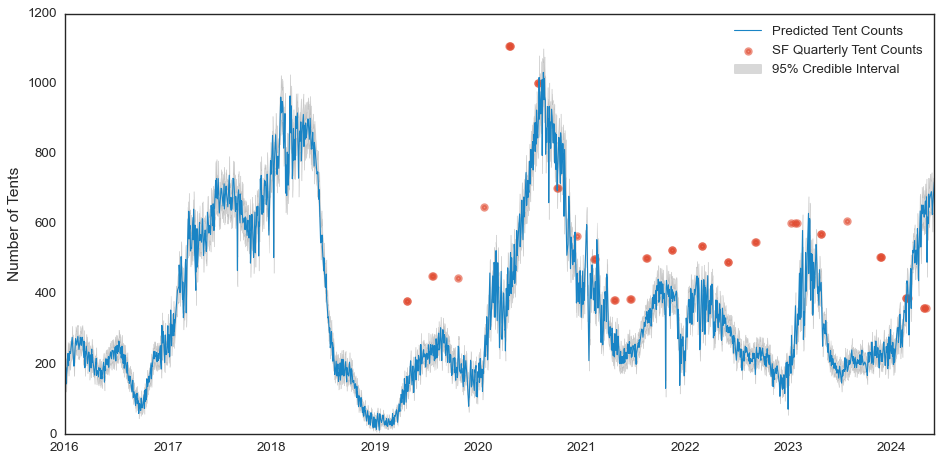

In [75]:
import datetime as dt
import statsmodels.api as sm

start_date = dt.datetime(2016, 1, 1)
end_date = dt.datetime(2024, 5, 31)

# Plot time-series
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-v0_8-white')

# Predicted mean
plt.plot(
    df_merge_70_noclamp['timestamp'], 
    df_merge_70_noclamp['mean_total'], 
    label='Predicted Tent Counts', 
    color='#1984c5',
    linewidth=1
)

plt.scatter(
    df_merge_70_noclamp['timestamp'], 
    df_merge_70_noclamp['tent_struc'], 
    label='SF Quarterly Tent Counts', 
    alpha=0.6, 
    marker='o',
    color='#e14b31',
    linewidth=3
)

# plt.bar(
#     df_merge_70_noclamp['timestamp'], 
#     df_merge_70_noclamp['tent_struc'], 
#     label='SF Quarterly Tent Counts', 
#     alpha=0.6, 
#     color='k'
# )

# Uncertainty band
plt.fill_between(
    df_merge_70_noclamp['timestamp'],
    df_merge_70_noclamp['lower95'],
    df_merge_70_noclamp['upper95'],
    color='grey',
    alpha=0.3,
    label='95% Credible Interval'
)

#plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Tents', fontsize=14)
plt.legend(fontsize=12)
plt.ylim(0,1200)
plt.xlim(start_date, end_date)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

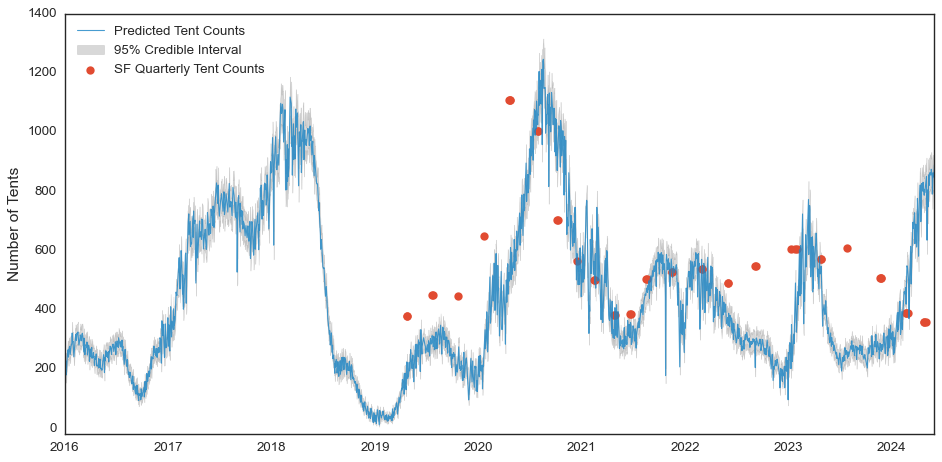

In [78]:
import datetime as dt
import statsmodels.api as sm

start_date = dt.datetime(2016, 1, 1)
end_date = dt.datetime(2024, 5, 31)

# Plot time-series
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-v0_8-white')

# Predicted mean
plt.plot(
    df_merge_69_noclamp['timestamp'], 
    df_merge_69_noclamp['mean_total'], 
    label='Predicted Tent Counts', 
    color='#1984c5',
    alpha=0.8,
    linewidth=1
)

# Uncertainty band
plt.fill_between(
    df_merge_69_noclamp['timestamp'],
    df_merge_69_noclamp['lower95'],
    df_merge_69_noclamp['upper95'],
    color='gray',
    alpha=0.3,
    label='95% Credible Interval'
)

plt.scatter(
    df_merge_69_noclamp['timestamp'], 
    df_merge_69_noclamp['tent_struc'], 
    label='SF Quarterly Tent Counts', 
    alpha=1, 
    marker='o',
    color='#e14b31',
    linewidth=3
)

#plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Tents', fontsize=14)
plt.legend(fontsize=12)
plt.ylim(-20,1400)
plt.xlim(start_date, end_date)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(loc='upper left', fontsize=12)

plt.tight_layout()
plt.show()

### Smoothing

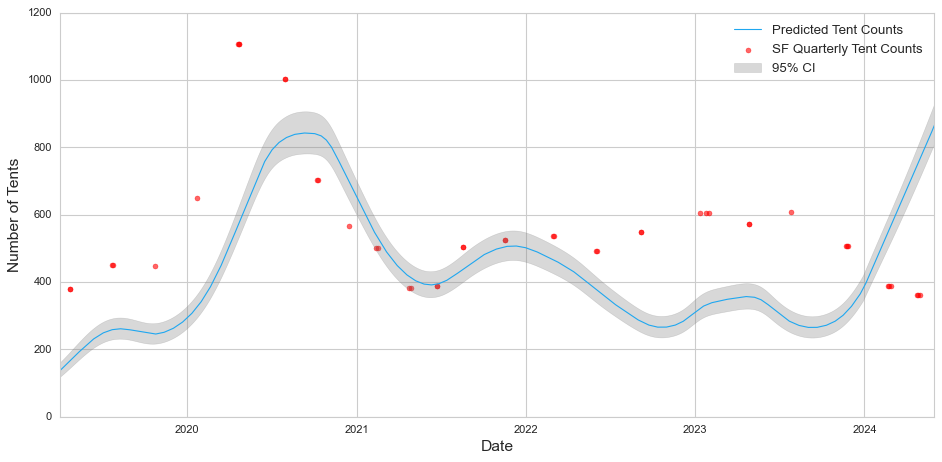

In [82]:
import datetime as dt
import statsmodels.api as sm

lowess_smoothed = sm.nonparametric.lowess(
    df_merge_69_noclamp['mean_total'],
    df_merge_69_noclamp['timestamp'].astype(int) / 10**9,
    frac=0.1,
    return_sorted=True
)

# Smooth uncertainty bands
df_merge_69_noclamp['lower95_smoothed'] = sm.nonparametric.lowess(
    df_merge_69_noclamp['lower95'],
    df_merge_69_noclamp['timestamp'].astype(int) / 10**9,
    frac=0.1,
    return_sorted=False
)

df_merge_69_noclamp['upper95_smoothed'] = sm.nonparametric.lowess(
    df_merge_69_noclamp['upper95'],
    df_merge_69_noclamp['timestamp'].astype(int) / 10**9,
    frac=0.1,
    return_sorted=False
)

df_merge_69_noclamp['smoothed_count'] = lowess_smoothed[:, 1]

start_date = dt.datetime(2019, 4, 1)
end_date = dt.datetime(2024, 5, 31)

# Plot time-series
plt.figure(figsize=(12, 6))
plt.style.use('seaborn-v0_8-whitegrid')

# Predicted mean
plt.plot(
    df_merge_69_noclamp['timestamp'], 
    df_merge_69_noclamp['smoothed_count'], 
    label='Predicted Tent Counts', 
    color='#1FA7F0',
    linewidth=1
)

plt.scatter(
    df_merge_69_noclamp['timestamp'], 
    df_merge_69_noclamp['tent_struc'], 
    label='SF Quarterly Tent Counts', 
    alpha=0.6, 
    marker='o',
    color='red'
)

# Uncertainty band
plt.fill_between(
    df_merge_69_noclamp['timestamp'],
    df_merge_69_noclamp['lower95_smoothed'],
    df_merge_69_noclamp['upper95_smoothed'],
    color='gray',
    alpha=0.3,
    label='95% CI'
)

plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of Tents', fontsize=14)
plt.legend(fontsize=12)
#plt.ylim(0,100)
plt.xlim(start_date, end_date)

plt.tight_layout()
plt.show()

## Bounding-box level visualization

In [85]:
df_combined_noclamp.head()

,timestamp,bboxid,GEOID,count,median,var,lower95,upper95,lower90,upper90,category
0,2016-11-09,bbox_10_14,60750604002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,train
1,2016-11-10,bbox_10_14,60750604002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,train
2,2016-11-10,bbox_10_15,60750332043,0.0,0.0,0.0,0.0,0.0,0.0,0.0,train
3,2016-11-09,bbox_10_16,60750332043,0.0,0.0,0.0,0.0,0.0,0.0,0.0,train
4,2016-11-10,bbox_10_16,60750332043,0.0,0.0,0.0,0.0,0.0,0.0,0.0,train


In [216]:
# Extract year from timestamp
df_combined_noclamp['timestamp'] = pd.to_datetime(df_combined_noclamp['timestamp'])
df_combined_noclamp['year'] = df_combined_noclamp['timestamp'].dt.year

# Group by year and bboxid, then calculate sum and mean the counts
yearly_counts = df_combined_noclamp.groupby(['year', 'bboxid'])['count'].sum().reset_index()
yearly_counts_mean = df_combined_noclamp.groupby(['year', 'bboxid'])['count'].mean().reset_index()

# Merge the yearly counts and yearly mean counts dataframes
yearly_counts = pd.merge(yearly_counts, yearly_counts_mean, on=['year', 'bboxid'], suffixes=('_sum', '_mean'))


In [217]:
yearly_counts.head()

,year,bboxid,count_sum,count_mean
0,2016,bbox_10_14,65.739967,0.179617
1,2016,bbox_10_15,67.417933,0.184202
2,2016,bbox_10_16,64.206715,0.175428
3,2016,bbox_10_17,59.271915,0.161945
4,2016,bbox_10_18,55.671962,0.152109


In [218]:
# Extract geo info from df_test
geo_info = df_test[['bboxid','geometry_bbox','center_latlon']].drop_duplicates()
yearly_counts = pd.merge(yearly_counts, geo_info, on='bboxid', how='left')


<Axes: >

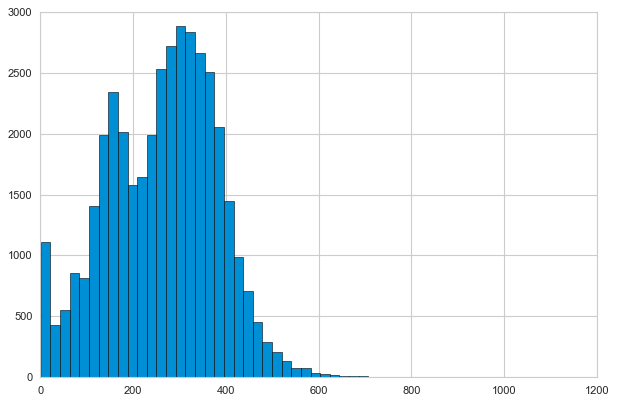

In [219]:
yearly_counts['count_sum'].hist(bins=50, edgecolor='black')

<Axes: >

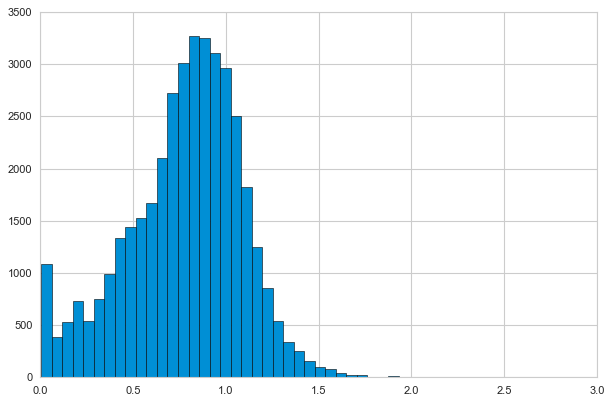

In [220]:
yearly_counts['count_mean'].hist(bins=50, edgecolor='black')

In [221]:
# Convert yearly_counts to geopandas DataFrame
from shapely import wkt
import geopandas as gpd
yearly_counts['geometry_bbox'] = yearly_counts['geometry_bbox'].apply(wkt.loads)

gdf_yearly_counts = gpd.GeoDataFrame(
    yearly_counts,
    geometry='geometry_bbox',
    crs='EPSG:4326'  # Assuming the coordinates are in WGS84
)

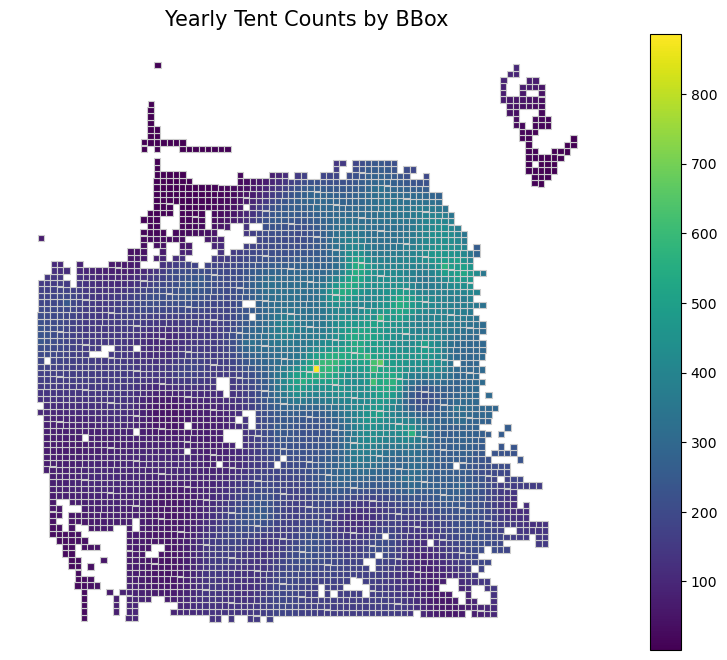

<Axes: >

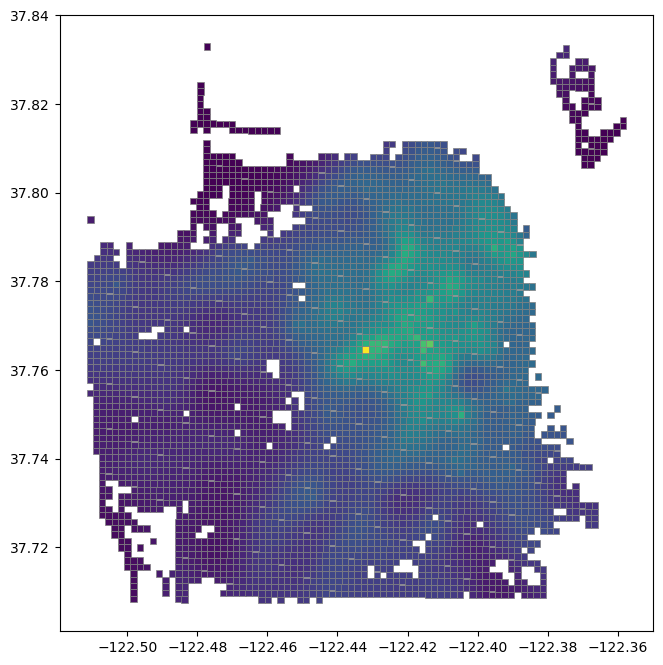

In [37]:
# Heat map of yearly tent counts

fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2016].plot(
    column='count',
    cmap='viridis',
    linewidth=0.8,
    ax=ax,
    edgecolor='0.8',
    legend=True
)
ax.set_title('Yearly Tent Counts by BBox', fontsize=15)
ax.set_axis_off()
plt.show()

# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2016].plot(
    column='count',
    cmap='viridis',
    linewidth=0.5,
    ax=ax,
    edgecolor='0.5',
) 

In [222]:
import contextily as ctx
ctx.providers

{'OpenStreetMap': {'Mapnik': {'url': 'https://tile.openstreetmap.org/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.Mapnik'},
  'DE': {'url': 'https://tile.openstreetmap.de/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.DE'},
  'CH': {'url': 'https://tile.osm.ch/switzerland/{z}/{x}/{y}.png',
   'max_zoom': 18,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap contributors',
   'bounds': [[45, 5], [48, 11]],
   'name': 'OpenStreetMap.CH'},
  'France': {'url': 'https://{s}.tile.openstreetmap.fr/osmfr/{z}/{x}/{y}.png',
   'max_zoom': 20,
   'html_attribution': '&copy; OpenStreetMap France | &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) OpenStreetMap France | (C) OpenStreetMap contributors',
   'name': 'OpenStreetMap.France'},
  'HOT': {'url': 'https://{s}.tile.openstreetmap.fr/hot/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles style by <a href="https://www.hotosm.org/" target="_blank">Humanitarian OpenStreetMap Team</a> hosted by <a href="https://openstreetmap.fr/" target="_blank">OpenStreetMap France</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles style by Humanitarian OpenStreetMap Team hosted by OpenStreetMap France',
   'name': 'OpenStreetMap.HOT'},
  'BZH': {'url': 'https://tile.openstreetmap.bzh/br/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="http://www.openstreetmap.bzh/" target="_blank">Breton OpenStreetMap Team</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
   'bounds': [[46.2, -5.5], [50, 0.7]],
   'name': 'OpenStreetMap.BZH'},
  'CAT': {'url': 'https://tile.openstreetmap.bzh/ca/{z}/{x}/{y}.png',
   'max_zoom': 19,
   'html_attribution': '&copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors, Tiles courtesy of <a href="https://www.openstreetmap.cat" target="_blank">Breton OpenStreetMap Team</a>',
   'attribution': '(C) OpenStreetMap contributors, Tiles courtesy of Breton OpenStreetMap Team',
   'name': 'OpenStreetMap.CAT'}},
 'MapTilesAPI': {'OSMEnglish': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'en/map/v1',
   'apikey': '<insert your api key here>',
   'max_zoom': 19,
   'name': 'MapTilesAPI.OSMEnglish'},
  'OSMFrancais': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
   'attribution': '(C) MapTiles API, (C) OpenStreetMap contributors',
   'variant': 'fr/map/v1',
   'apikey': '<insert your api key here>',
   'max_zoom': 19,
   'name': 'MapTilesAPI.OSMFrancais'},
  'OSMEspagnol': {'url': 'https://maptiles.p.rapidapi.com/{variant}/{z}/{x}/{y}.png?rapidapi-key={apikey}',
   'html_attribution': '&copy; <a href="http://www.maptilesapi.com/">MapTiles API</a>, &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contribut

<Axes: xlabel='year'>

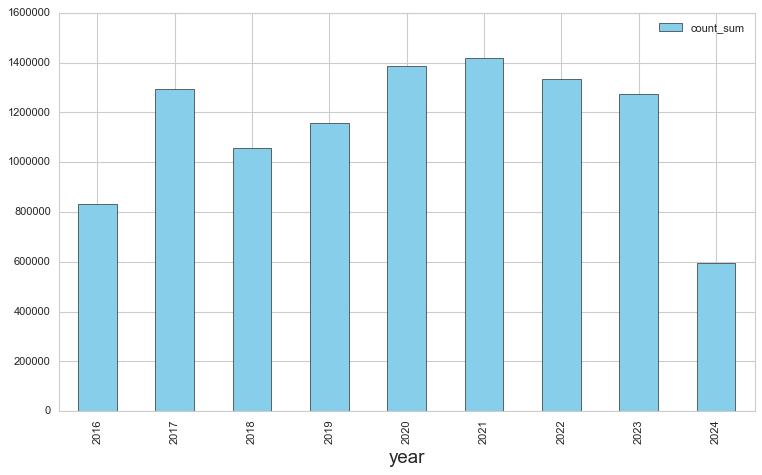

In [230]:
year_trend = gdf_yearly_counts[['year','count_sum']].groupby('year').sum().reset_index()
year_trend.plot(x='year', y='count_sum', kind='bar', figsize=(10,6), color='skyblue', edgecolor='black')

In [232]:
# Max-min normalization of counts by year
def min_max_normalize(series):
    return (series - series.min()) / (series.max() - series.min())

gdf_yearly_counts['normalized_count'] = gdf_yearly_counts.groupby('year')['count_sum'].transform(min_max_normalize)
gdf_yearly_counts['normalized_count_entire'] = gdf_yearly_counts['count_sum'].transform(min_max_normalize)
gdf_yearly_counts['normalized_mean'] = gdf_yearly_counts.groupby('year')['count_mean'].transform(min_max_normalize)
gdf_yearly_counts['normalized_mean_entire'] = gdf_yearly_counts['count_mean'].transform(min_max_normalize)

# Standardize counts by year (z-score normalization)
def z_score_normalize(series):
    return (series - series.mean()) / series.std()

gdf_yearly_counts['z_score'] = gdf_yearly_counts.groupby('year')['count_sum'].transform(z_score_normalize)
gdf_yearly_counts['z_score_entire'] = (gdf_yearly_counts['count_sum'] - gdf_yearly_counts['count_sum'].mean()) / gdf_yearly_counts['count_sum'].std()
gdf_yearly_counts['z_score_mean'] = gdf_yearly_counts.groupby('year')['count_mean'].transform(z_score_normalize)
gdf_yearly_counts['z_score_mean_entire'] = gdf_yearly_counts['count_mean'].transform(z_score_normalize)
gdf_yearly_counts.head(10)


,year,bboxid,count_sum,count_mean,geometry_bbox,center_latlon,normalized_count,normalized_count_entire,normalized_mean,normalized_mean_entire,z_score,z_score_entire,z_score_mean,z_score_mean_entire
0,2016,bbox_10_14,65.739967,0.179617,"POLYGON ((-122.48627 37.71914, -122.48443 37.7...","(37.71986168151697, -122.48535268128838)",0.072258,0.062118,0.072258,0.061538,-1.074040,-1.678990,-1.074040,-1.917829
1,2016,bbox_10_15,67.417933,0.184202,"POLYGON ((-122.48444 37.71913, -122.48261 37.7...","(37.71985369613769, -122.4835266585265)",0.074157,0.063734,0.074157,0.063155,-1.059572,-1.664678,-1.059572,-1.903109
2,2016,bbox_10_16,64.206715,0.175428,"POLYGON ((-122.48262 37.71912, -122.48078 37.7...","(37.719845682477825, -122.48170063648698)",0.070523,0.060641,0.070523,0.060060,-1.087261,-1.692068,-1.087261,-1.931280
3,2016,bbox_10_17,59.271915,0.161945,"POLYGON ((-122.48079 37.71912, -122.47896 37.7...","(37.71983764053741, -122.47987461517232)",0.064937,0.055887,0.064937,0.055303,-1.129811,-1.734160,-1.129811,-1.974572
4,2016,bbox_10_18,55.671962,0.152109,"POLYGON ((-122.47897 37.71911, -122.47713 37.7...","(37.719829570316485, -122.47804859458512)",0.060862,0.052419,0.060862,0.051833,-1.160852,-1.764866,-1.160852,-2.006154
5,2016,bbox_10_19,46.998187,0.128410,"POLYGON ((-122.47714 37.7191, -122.4753 37.719...","(37.71982147181507, -122.47622257472793)",0.051045,0.044063,0.051045,0.043472,-1.235642,-1.838850,-1.235642,-2.082247
6,2016,bbox_10_20,49.874975,0.136270,"POLYGON ((-122.47531 37.71909, -122.47348 37.7...","(37.71981334503321, -122.47439655560328)",0.054301,0.046835,0.054301,0.046245,-1.210837,-1.814312,-1.210837,-2.057009
7,2016,bbox_10_21,47.595011,0.130041,"POLYGON ((-122.47349 37.71908, -122.47165 37.7...","(37.71980518997093, -122.47257053721376)",0.051720,0.044638,0.051720,0.044047,-1.230496,-1.833760,-1.230496,-2.077011
8,2016,bbox_10_22,53.046507,0.144936,"POLYGON ((-122.47166 37.71908, -122.46983 37.7...","(37.71979700662828, -122.47074451956186)",0.057891,0.049890,0.057891,0.049302,-1.183490,-1.787260,-1.183490,-2.029186
9,2016,bbox_10_23,60.646255,0.165700,"POLYGON ((-122.46984 37.71907, -122.468 37.719...","(37.71978879500529, -122.46891850265021)",0.066493,0.057211,0.066493,0.056628,-1.117961,-1.722437,-1.117961,-1.962515


<Axes: >

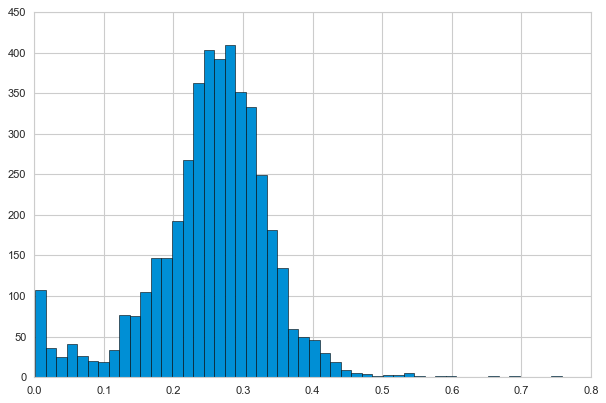

In [233]:
gdf_yearly_counts[gdf_yearly_counts['year'] == 2019]['normalized_count_entire'].hist(bins=50, edgecolor='black')

<Axes: >

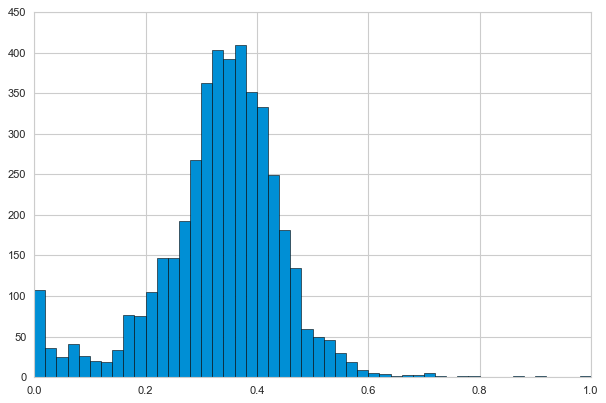

In [234]:
gdf_yearly_counts[gdf_yearly_counts['year'] == 2019]['normalized_count'].hist(bins=50, edgecolor='black')

<Axes: >

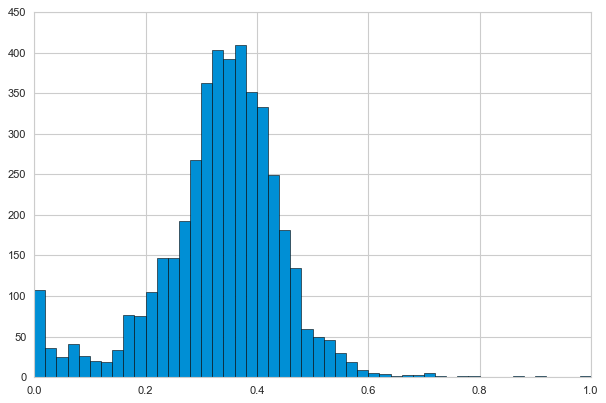

In [236]:
gdf_yearly_counts[gdf_yearly_counts['year'] == 2019]['normalized_mean'].hist(bins=50, edgecolor='black')

<Axes: >

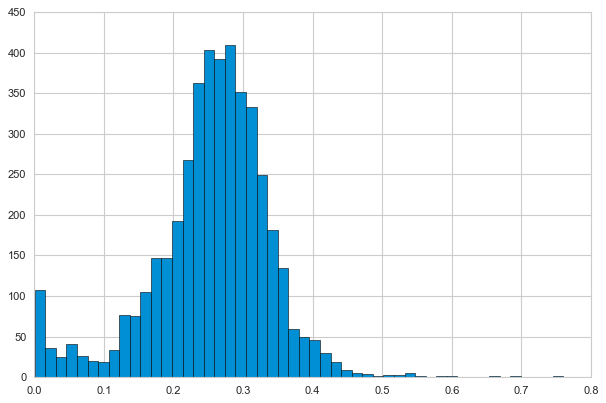

In [235]:
gdf_yearly_counts[gdf_yearly_counts['year'] == 2019]['normalized_mean_entire'].hist(bins=50, edgecolor='black')

<Axes: >

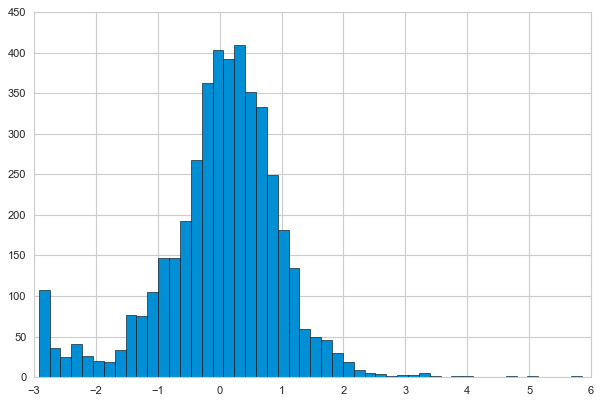

In [238]:
gdf_yearly_counts[gdf_yearly_counts['year'] == 2019]['z_score_mean'].hist(bins=50, edgecolor='black')

<Axes: >

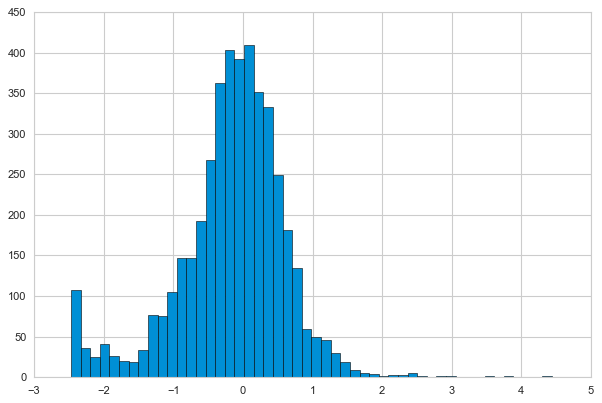

In [237]:
gdf_yearly_counts[gdf_yearly_counts['year'] == 2019]['z_score_mean_entire'].hist(bins=50, edgecolor='black')

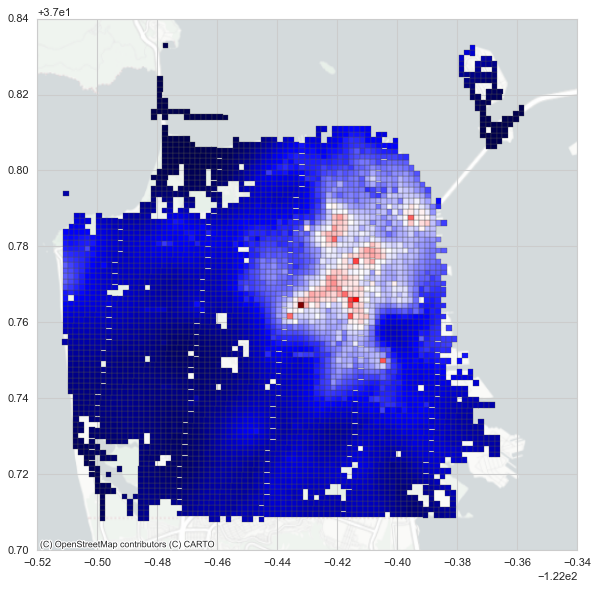

In [240]:
# Heat map of yearly tent counts
# Add map layer
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2016].plot(
    column='normalized_mean_entire',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


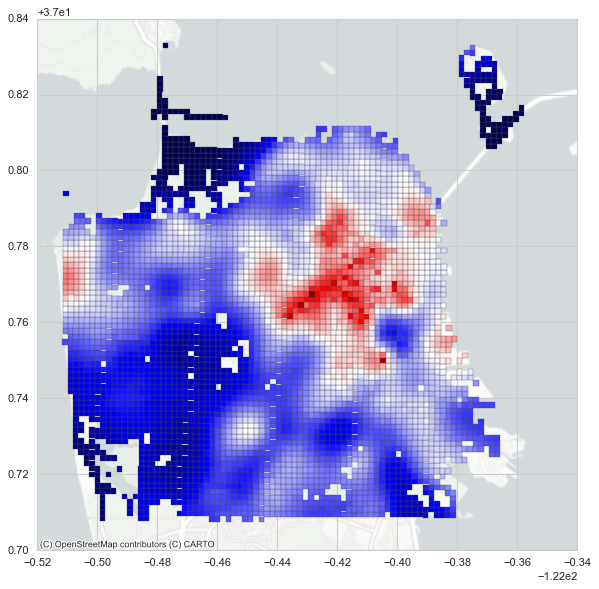

In [164]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2017].plot(
    column='normalized_count_entire',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


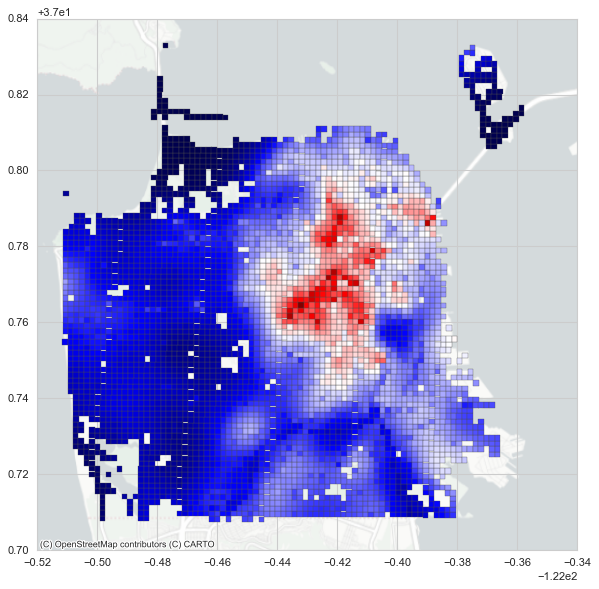

In [165]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2018].plot(
    column='normalized_count_entire',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


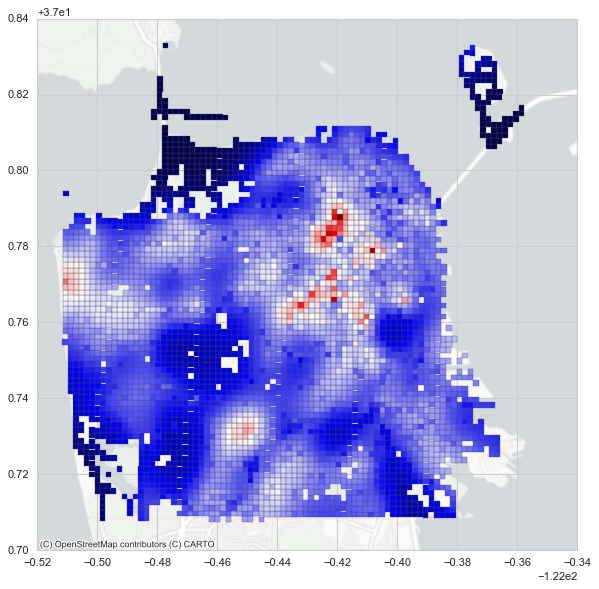

In [166]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2019].plot(
    column='normalized_count_entire',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


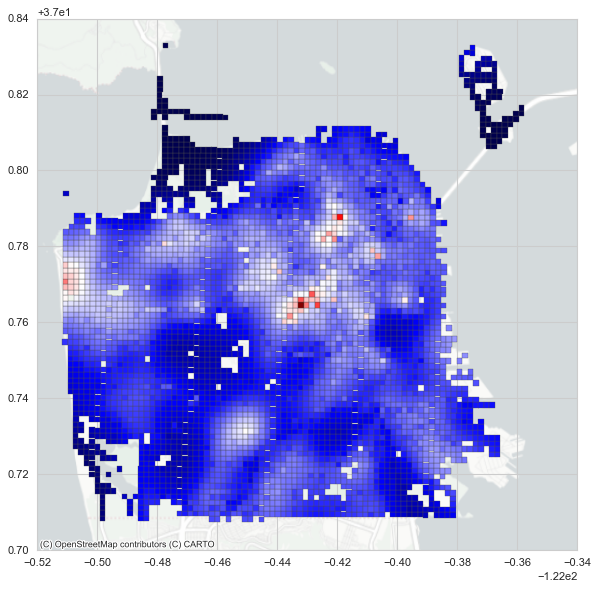

In [167]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2020].plot(
    column='normalized_count_entire',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


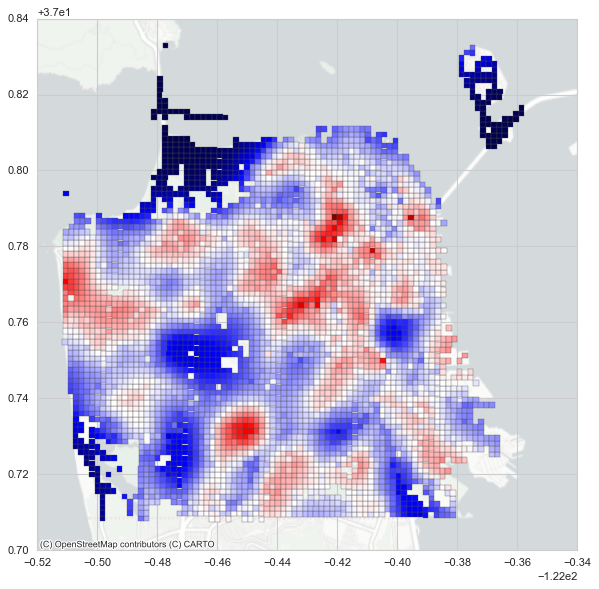

In [168]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2021].plot(
    column='normalized_count_entire',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


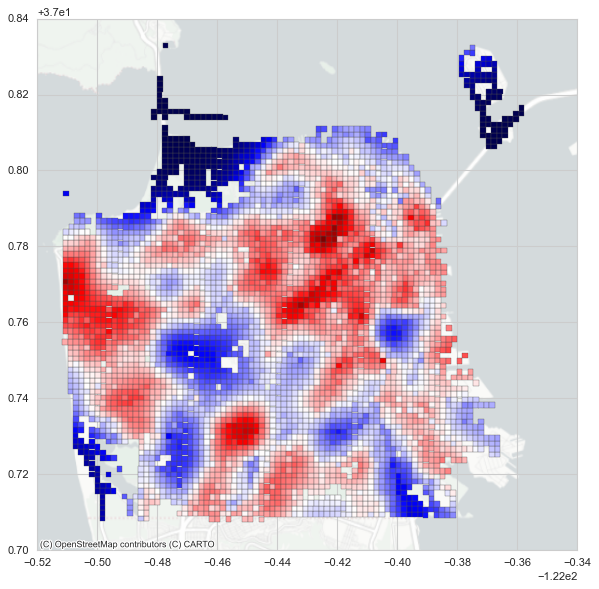

In [169]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2022].plot(
    column='normalized_count_entire',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


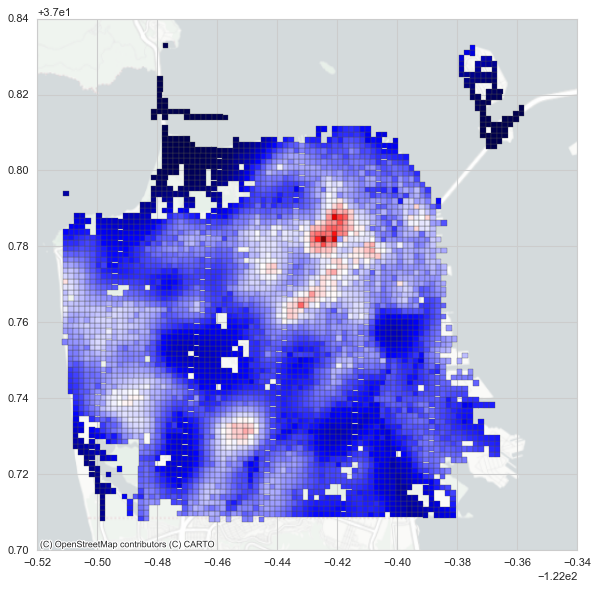

In [170]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2023].plot(
    column='normalized_count_entire',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


### Using standardized count by year

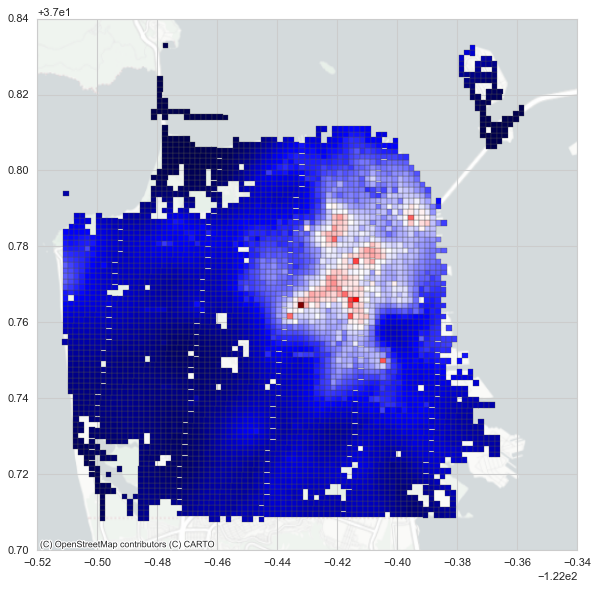

In [182]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2016].plot(
    column='z_score',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


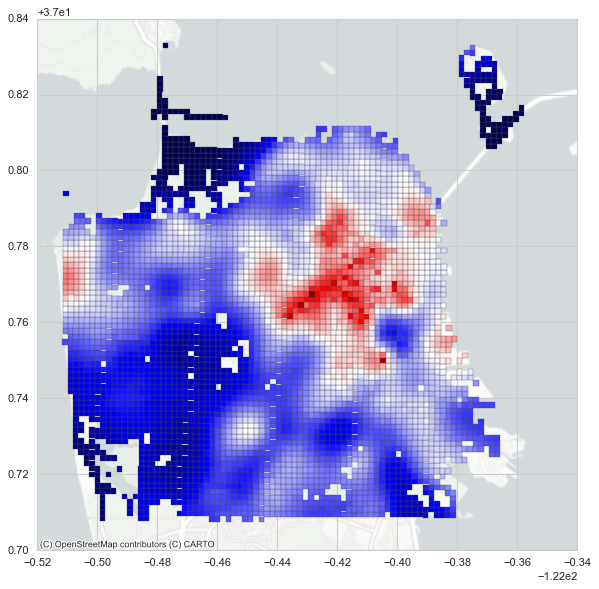

In [183]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2017].plot(
    column='z_score',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


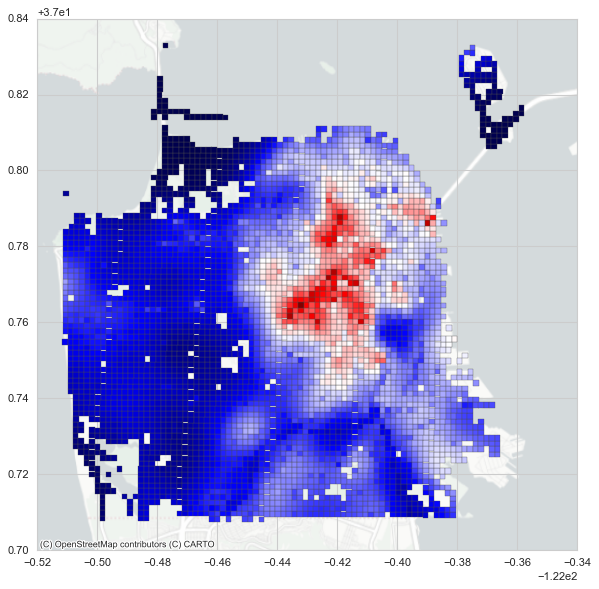

In [184]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2018].plot(
    column='z_score',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


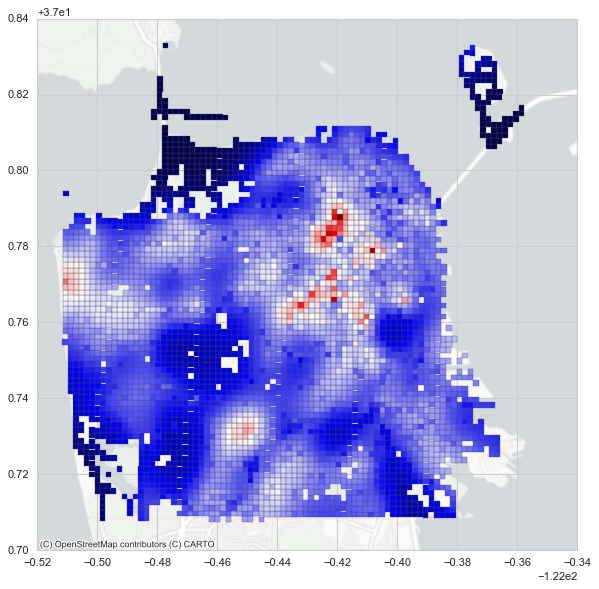

In [185]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2019].plot(
    column='z_score',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


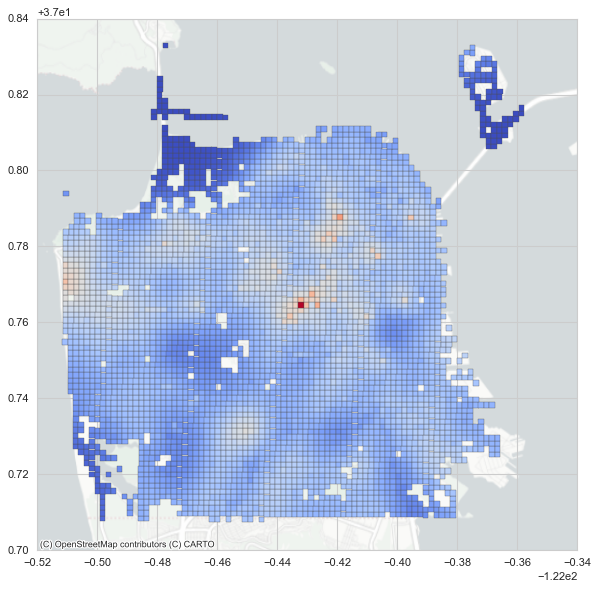

In [195]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2020].plot(
    column='z_score',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


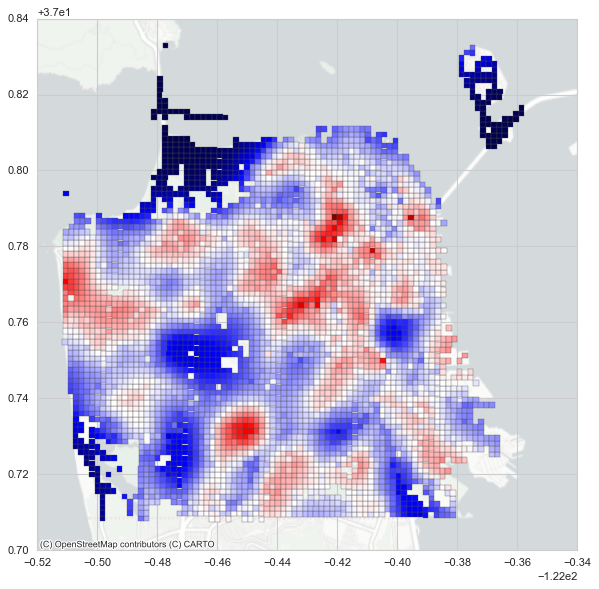

In [187]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2021].plot(
    column='z_score',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


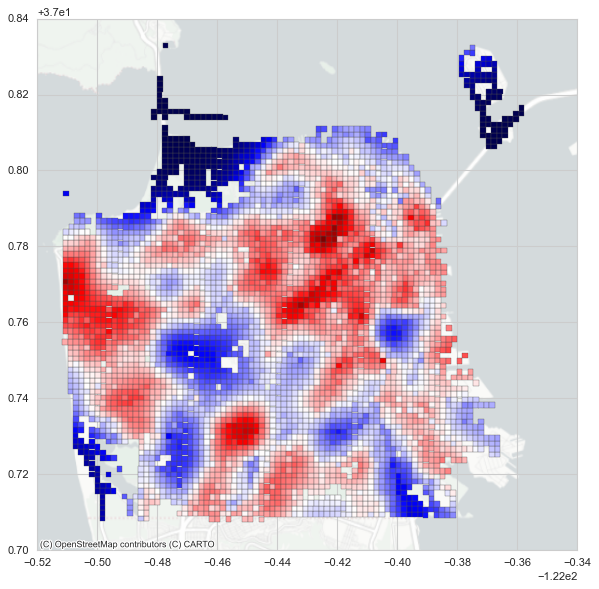

In [189]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2022].plot(
    column='count',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


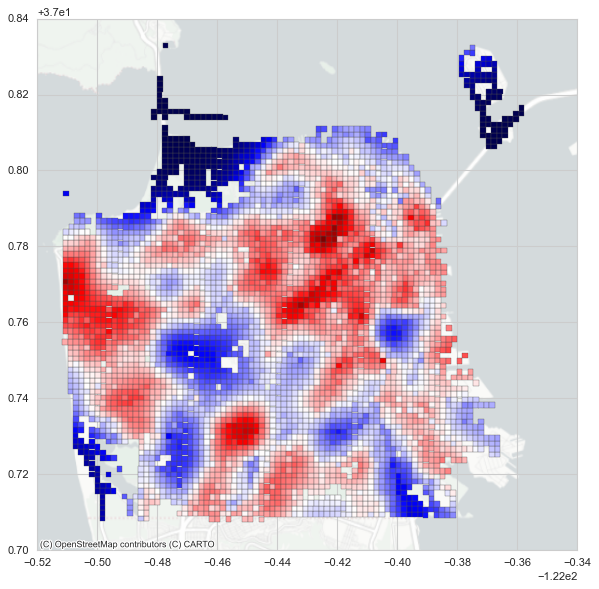

In [188]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2022].plot(
    column='z_score',
    cmap='seismic',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


<Axes: >

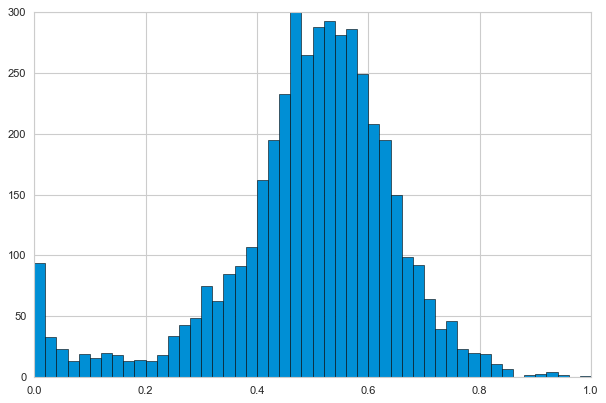

In [190]:
gdf_yearly_counts[gdf_yearly_counts['year'] == 2022]['normalized_count'].hist(bins=50, edgecolor='black')

<Axes: >

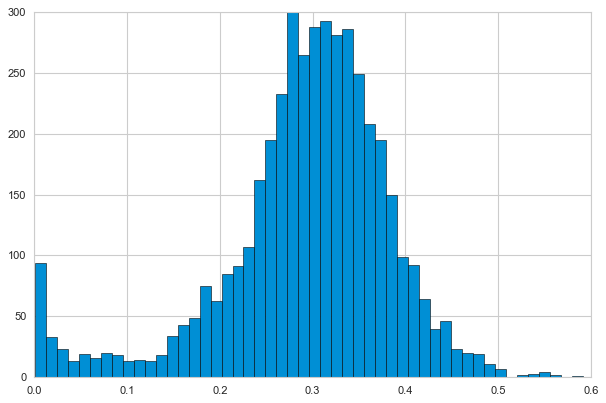

In [191]:
gdf_yearly_counts[gdf_yearly_counts['year'] == 2022]['normalized_count_entire'].hist(bins=50, edgecolor='black')

<Axes: >

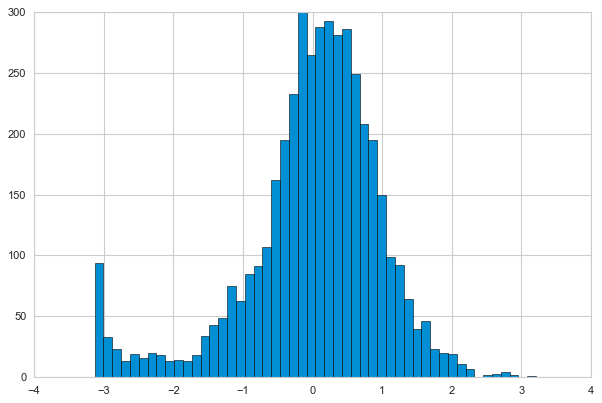

In [192]:
gdf_yearly_counts[gdf_yearly_counts['year'] == 2022]['z_score'].hist(bins=50, edgecolor='black')

<Axes: >

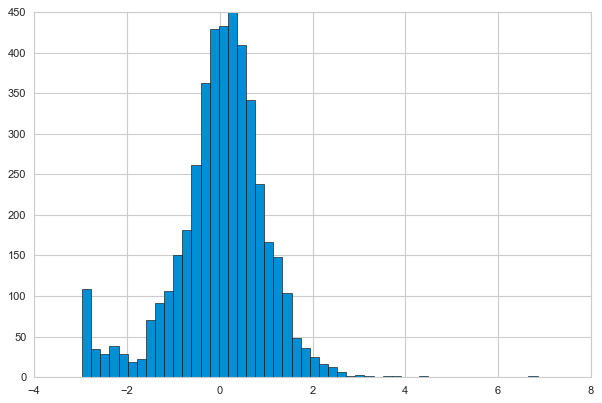

In [194]:
gdf_yearly_counts[gdf_yearly_counts['year'] == 2020]['z_score'].hist(bins=50, edgecolor='black')

In [180]:
gdf_yearly_counts[gdf_yearly_counts['year'] == 2020]

,year,bboxid,count,geometry_bbox,center_latlon,normalized_count,normalized_count_entire
17516,2020,bbox_10_14,246.663758,"POLYGON ((-122.48627 37.71914, -122.48443 37.7...","(37.71986168151697, -122.48535268128838)",0.234813,0.236409
17517,2020,bbox_10_15,251.597319,"POLYGON ((-122.48444 37.71913, -122.48261 37.7...","(37.71985369613769, -122.4835266585265)",0.239576,0.241162
17518,2020,bbox_10_16,240.854403,"POLYGON ((-122.48262 37.71912, -122.48078 37.7...","(37.719845682477825, -122.48170063648698)",0.229205,0.230813
17519,2020,bbox_10_17,222.295780,"POLYGON ((-122.48079 37.71912, -122.47896 37.7...","(37.71983764053741, -122.47987461517232)",0.211290,0.212935
17520,2020,bbox_10_18,204.759649,"POLYGON ((-122.47897 37.71911, -122.47713 37.7...","(37.719829570316485, -122.47804859458512)",0.194361,0.196041
...,...,...,...,...,...,...,...
21890,2020,bbox_9_64,234.333631,"POLYGON ((-122.39498 37.71726, -122.39315 37.7...","(37.717977295719706, -122.39406429262873)",0.222910,0.224531
21891,2020,bbox_9_65,267.142710,"POLYGON ((-122.39316 37.71725, -122.39132 37.7...","(37.71796789684439, -122.39223834470856)",0.254583,0.256138
21892,2020,bbox_9_66,295.888944,"POLYGON ((-122.39133 37.71724, -122.38949 37.7...","(37.71795846969183, -122.39041239763831)",0.282333,0.283830
21893,2020,bbox_9_67,279.730760,"POLYGON ((-122.38951 37.71723, -122.38767 37.7...","(37.717949014262075, -122.38858645142055)",0.266735,0.268264


In [178]:
gdf_yearly_counts[gdf_yearly_counts['year'] == 2022]

,year,bboxid,count,geometry_bbox,center_latlon,normalized_count,normalized_count_entire
26274,2022,bbox_10_14,291.929418,"POLYGON ((-122.48627 37.71914, -122.48443 37.7...","(37.71986168151697, -122.48535268128838)",0.472372,0.280016
26275,2022,bbox_10_15,303.563438,"POLYGON ((-122.48444 37.71913, -122.48261 37.7...","(37.71985369613769, -122.4835266585265)",0.491376,0.291223
26276,2022,bbox_10_16,287.767260,"POLYGON ((-122.48262 37.71912, -122.48078 37.7...","(37.719845682477825, -122.48170063648698)",0.465573,0.276006
26277,2022,bbox_10_17,262.904997,"POLYGON ((-122.48079 37.71912, -122.47896 37.7...","(37.71983764053741, -122.47987461517232)",0.424959,0.252055
26278,2022,bbox_10_18,233.384544,"POLYGON ((-122.47897 37.71911, -122.47713 37.7...","(37.719829570316485, -122.47804859458512)",0.376736,0.223617
...,...,...,...,...,...,...,...
30648,2022,bbox_9_64,217.127817,"POLYGON ((-122.39498 37.71726, -122.39315 37.7...","(37.717977295719706, -122.39406429262873)",0.350181,0.207956
30649,2022,bbox_9_65,242.519814,"POLYGON ((-122.39316 37.71725, -122.39132 37.7...","(37.71796789684439, -122.39223834470856)",0.391659,0.232417
30650,2022,bbox_9_66,268.726627,"POLYGON ((-122.39133 37.71724, -122.38949 37.7...","(37.71795846969183, -122.39041239763831)",0.434469,0.257664
30651,2022,bbox_9_67,246.984396,"POLYGON ((-122.38951 37.71723, -122.38767 37.7...","(37.717949014262075, -122.38858645142055)",0.398952,0.236718


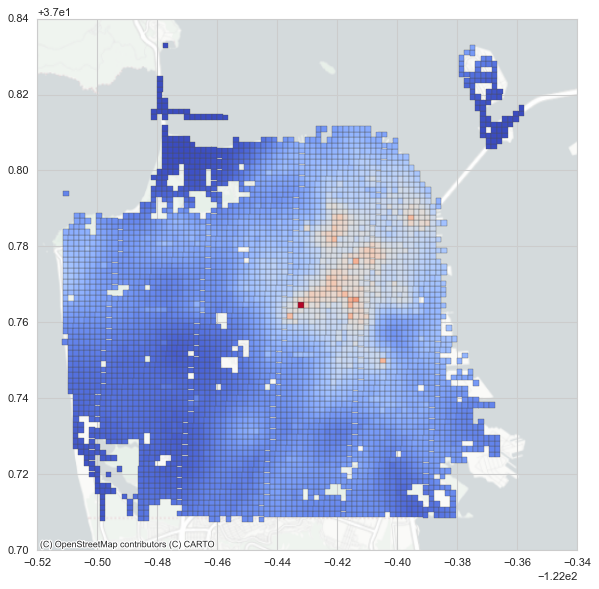

In [208]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2016].plot(
    column='z_score',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


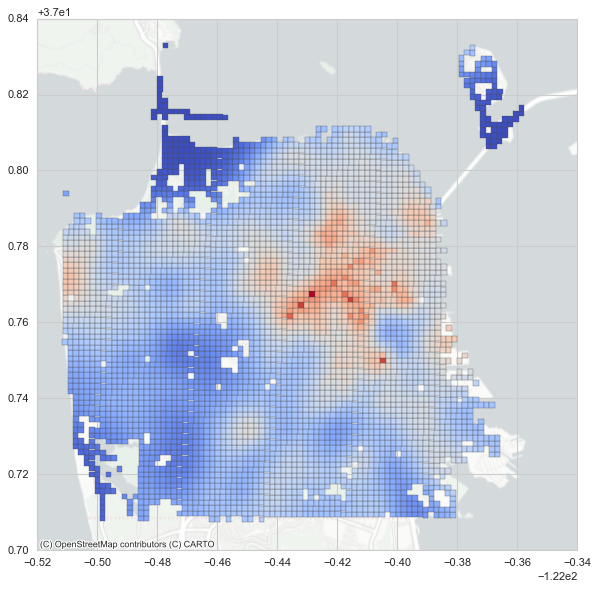

In [197]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2017].plot(
    column='z_score',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


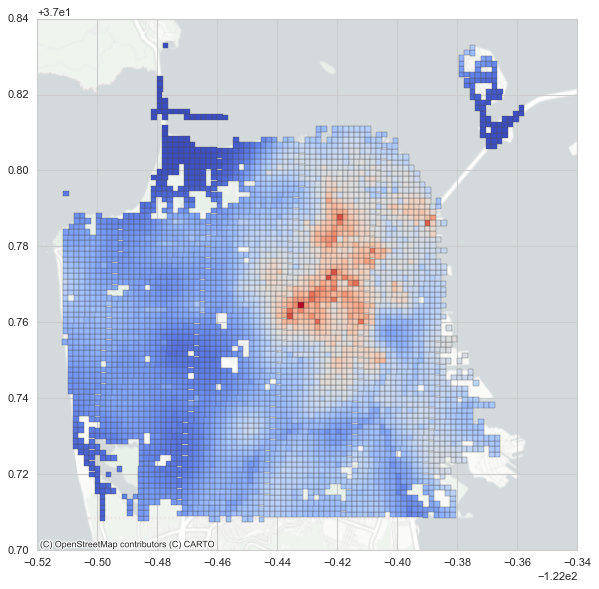

In [199]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2018].plot(
    column='z_score',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


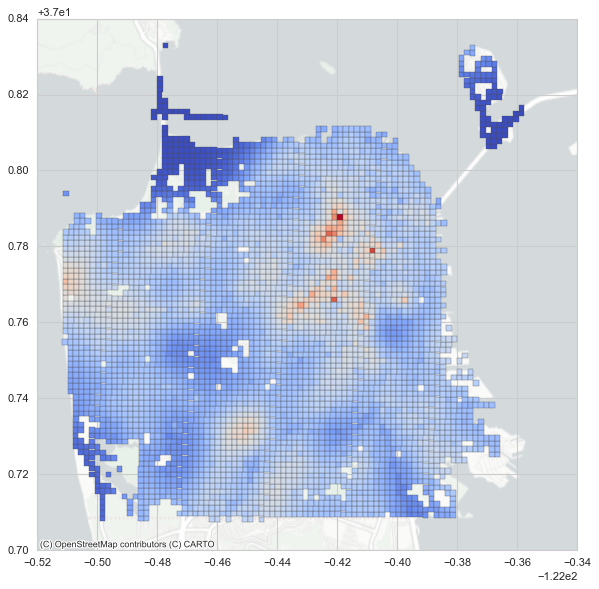

In [200]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2019].plot(
    column='z_score',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


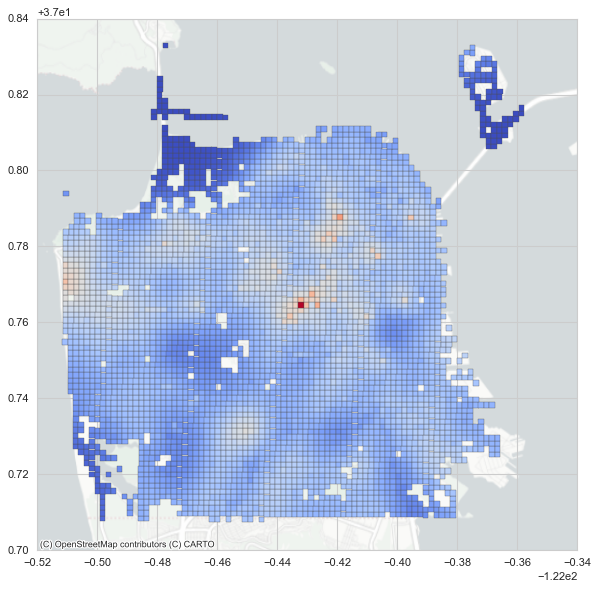

In [201]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2020].plot(
    column='z_score',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


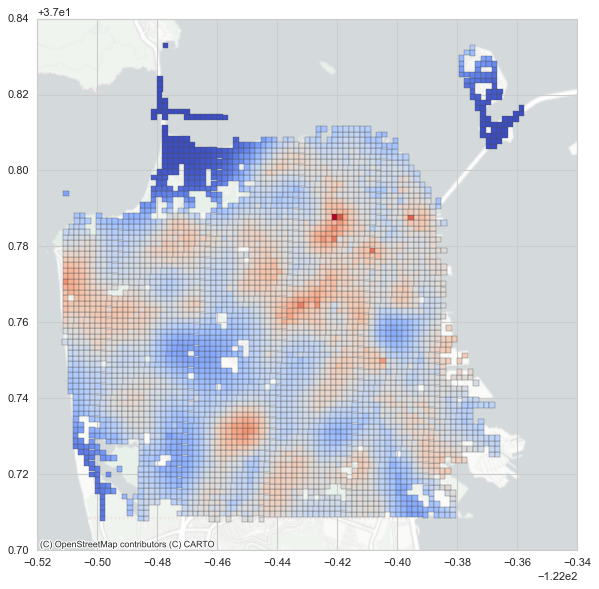

In [202]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2021].plot(
    column='z_score',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


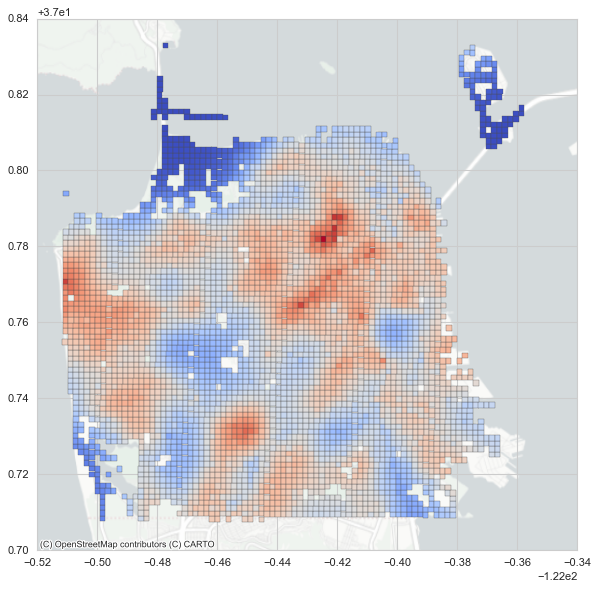

In [203]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2022].plot(
    column='z_score',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


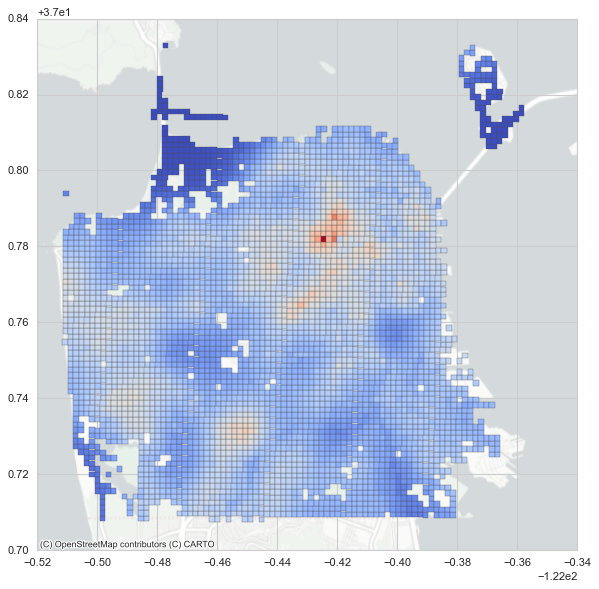

In [204]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2023].plot(
    column='z_score',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


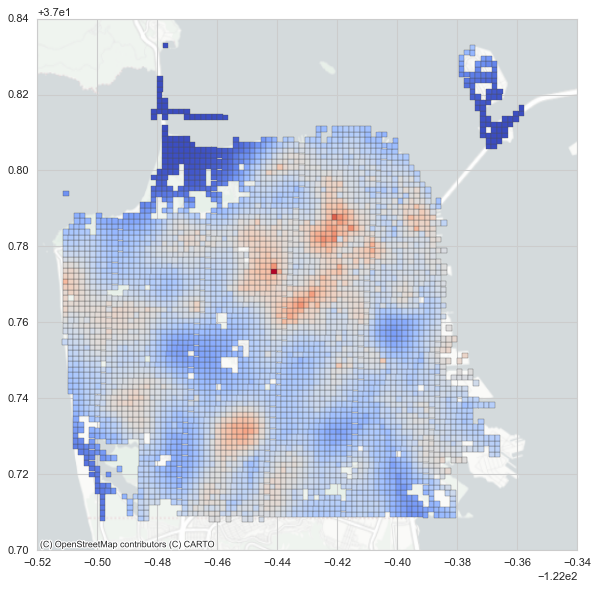

In [205]:
# Heat map of yearly tent counts
# Add map layer
import contextily as ctx
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2024].plot(
    column='z_score',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


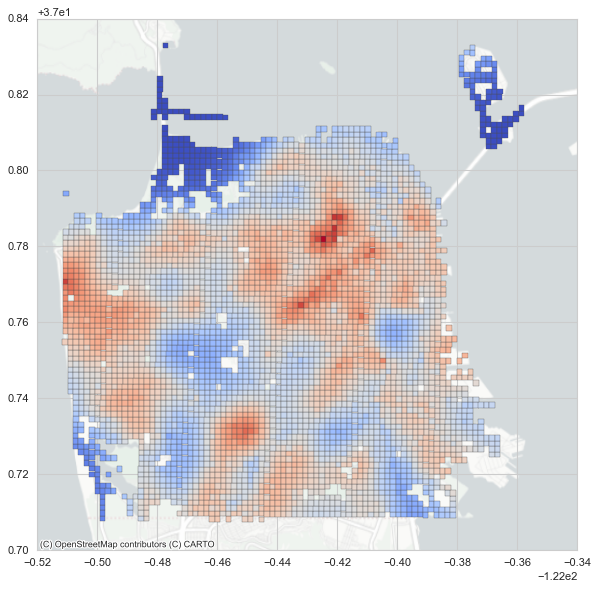

In [241]:
# Heat map of yearly tent counts
# Add map layer
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2022].plot(
    column='z_score',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


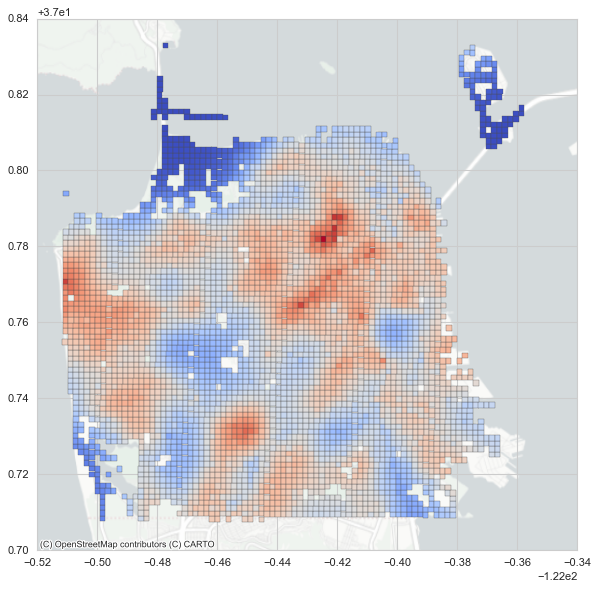

In [242]:
# Heat map of yearly tent counts
# Add map layer
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2022].plot(
    column='z_score_mean',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


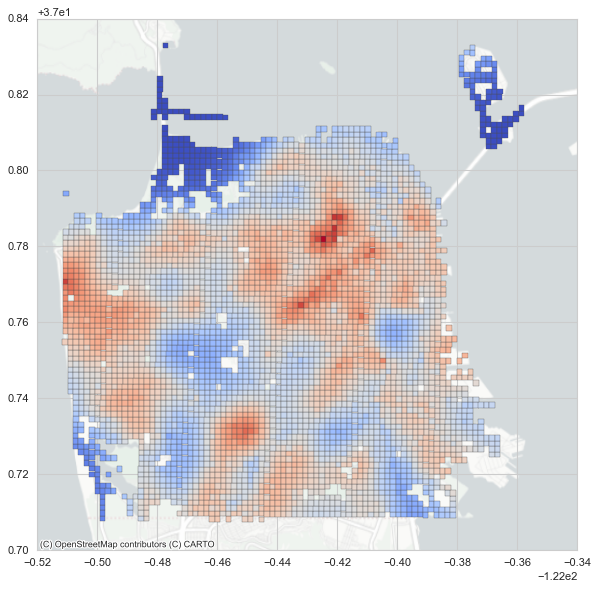

In [245]:
# Heat map of yearly tent counts
# Add map layer
fig, ax = plt.subplots(1, 1, figsize=(12, 8))
gdf_yearly_counts[gdf_yearly_counts['year'] == 2022].plot(
    column='z_score_mean_entire',
    cmap='coolwarm',
    linewidth=0.3,
    ax=ax,
    edgecolor='0.3',
    alpha=1
) 

# Add real map layer
ctx.add_basemap(ax, crs=gdf_yearly_counts.crs.to_string(), source=ctx.providers.CartoDB.PositronNoLabels)


In [249]:
gdf_yearly_counts.head(2)

,year,bboxid,count_sum,count_mean,geometry_bbox,center_latlon,normalized_count,normalized_count_entire,normalized_mean,normalized_mean_entire,z_score,z_score_entire,z_score_mean,z_score_mean_entire
0,2016,bbox_10_14,65.739967,0.179617,"POLYGON ((-122.48627 37.71914, -122.48443 37.7...","(37.71986168151697, -122.48535268128838)",0.072258,0.062118,0.072258,0.061538,-1.074040,-1.678990,-1.074040,-1.917829
1,2016,bbox_10_15,67.417933,0.184202,"POLYGON ((-122.48444 37.71913, -122.48261 37.7...","(37.71985369613769, -122.4835266585265)",0.074157,0.063734,0.074157,0.063155,-1.059572,-1.664678,-1.059572,-1.903109


In [262]:
gdf_web['count_mean'].max()

2.8396489295081966

In [264]:
max_abs =np.nanmax(np.abs(gdf_web['count_mean'].to_numpy()))
max(1e-9, max_abs)

np.float64(2.8396489295081966)

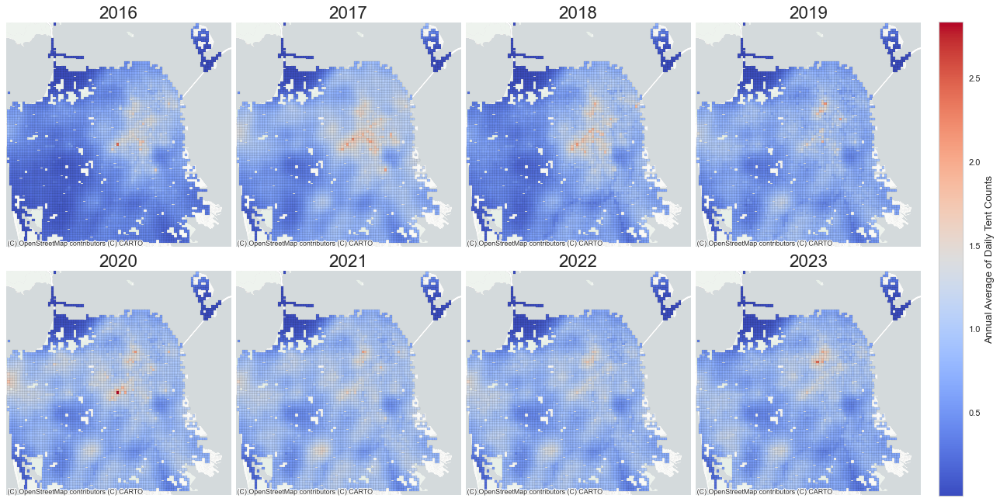

In [274]:
import matplotlib.colors as colors

# Years to show
years = list(range(2016, 2024))

# Reproject once for basemap tiles
gdf_web = gdf_yearly_counts[gdf_yearly_counts['year'].isin(years)].to_crs(epsg=3857)

# --- Fixed, shared scale across ALL maps ---
# For z-scores, a symmetric diverging scale around 0 is natural.
# Option A: use the global max abs value found in your data
min_abs = np.nanmin(np.abs(gdf_web['count_mean'].to_numpy()))
max_abs = np.nanmax(np.abs(gdf_web['count_mean'].to_numpy()))
vlim = max(1e-9, max_abs)  # avoid zero-width norm
norm = colors.TwoSlopeNorm(vmin=min_abs, vcenter=(vlim+min_abs)/2, vmax=vlim)
cmap = plt.cm.coolwarm

# Make a grid (8 years => 2 rows x 4 cols)
ncols = 4
nrows = int(np.ceil(len(years) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows), constrained_layout=True)
axes = np.atleast_2d(axes).ravel()

for ax, yr in zip(axes, years):
    g = gdf_web[gdf_web['year'] == yr]
    if g.empty:
        ax.set_axis_off()
        continue

    g.plot(
        column='count_mean',
        ax=ax,
        cmap=cmap,
        norm=norm,          # <-- same norm for every map (fixed colors)
        edgecolor='0.1',
        linewidth=0.1,
        alpha=1,
        legend=False
    )
    ctx.add_basemap(ax, crs=g.crs, source=ctx.providers.CartoDB.PositronNoLabels)
    ax.set_title(str(yr))
    ax.set_axis_off()

# Hide any unused axes if grid > number of years
for ax in axes[len(years):]:
    ax.set_axis_off()

# One shared colorbar
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes.tolist(), fraction=0.03, pad=0.02)
cbar.set_label("Annual Average of Daily Tent Counts", fontsize=12)

plt.show()


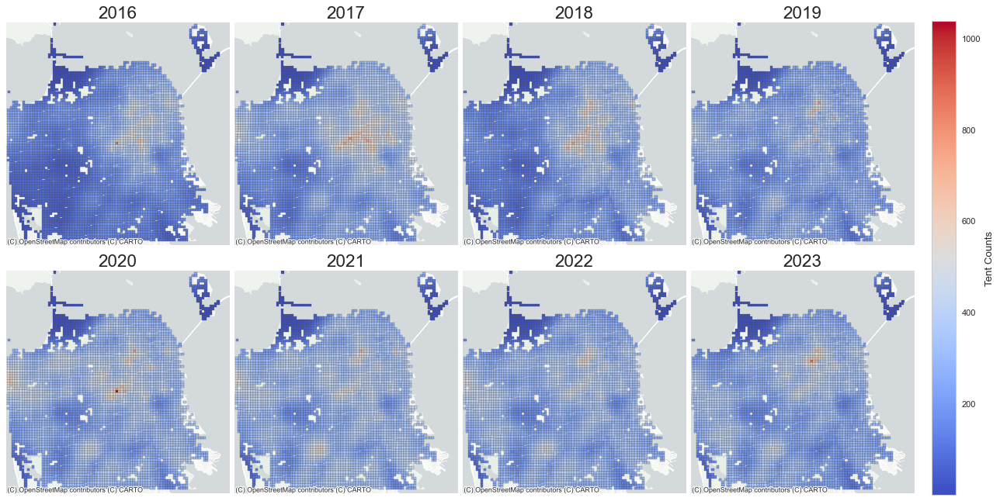

In [269]:
import matplotlib.colors as colors

# Years to show
years = list(range(2016, 2024))

# Reproject once for basemap tiles
gdf_web = gdf_yearly_counts[gdf_yearly_counts['year'].isin(years)].to_crs(epsg=3857)

# --- Fixed, shared scale across ALL maps ---
# For z-scores, a symmetric diverging scale around 0 is natural.
# Option A: use the global max abs value found in your data
max_abs = np.nanmax(np.abs(gdf_web['count_sum'].to_numpy()))
min_abs = np.nanmin(np.abs(gdf_web['count_sum'].to_numpy()))
vlim = max(1e-9, max_abs)  # avoid zero-width norm
norm = colors.TwoSlopeNorm(vmin=min_abs, vcenter=(vlim+min_abs)/2, vmax=vlim)
cmap = plt.cm.coolwarm

# Make a grid (8 years => 2 rows x 4 cols)
ncols = 4
nrows = int(np.ceil(len(years) / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows), constrained_layout=True)
axes = np.atleast_2d(axes).ravel()

for ax, yr in zip(axes, years):
    g = gdf_web[gdf_web['year'] == yr]
    if g.empty:
        ax.set_axis_off()
        continue

    g.plot(
        column='count_sum',
        ax=ax,
        cmap=cmap,
        norm=norm,          # <-- same norm for every map (fixed colors)
        edgecolor='0.3',
        linewidth=0.3,
        alpha=1,
        legend=False
    )
    ctx.add_basemap(ax, crs=g.crs, source=ctx.providers.CartoDB.PositronNoLabels)
    ax.set_title(str(yr))
    ax.set_axis_off()

# Hide any unused axes if grid > number of years
for ax in axes[len(years):]:
    ax.set_axis_off()

# One shared colorbar
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes.tolist(), fraction=0.03, pad=0.02)
cbar.set_label("Tent Counts", fontsize=12)

plt.show()
